# Basic Analysis for Sources Without Known Pulsations

In [1]:
from uncertainties import ufloat
from uncertainties.umath import *
import math
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
from astropy.stats import LombScargle
from scipy import signal
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")
import scipy.optimize
import glob
from astropy.table import Table,join,vstack,unique
from importlib import reload
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import seaborn as sb
import scipy.stats as st
import wotan

import ogle as o #module

blue = 'cornflowerblue'
navy = 'navy'
purple = 'rebeccapurple'
pink = '#CF6275'
maroon = 'maroon'

In [20]:
#file names of part 2 objects
cross2 = Table.read('part2files.csv')
#table with all objects w/ additional info (est. period)
full = Table.read('smc_x_m03_zar_match_OGLE_v2.ascii',format='ascii')

In [21]:
#intersection of cross and full
cross = join(cross2,full,keys='src_n')

In [22]:
cross[:3]

src_n,name,RA,dec,OII I,OII V,OIII I,OIII V,OIV I,OIV V,OGLE,RA_OGLE,DEC_OGLE,ra_deg,dec_deg,perr,period,Porb,_RAJ2000_1,_DEJ2000_1,__M2002_,Vmag_1,Separation_1,_RAJ2000_2,_DEJ2000_2,Vmag_2,recno,Separation
int64,str14,str10,str11,str37,str37,str38,str38,str49,str49,str38,str11,str11,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64
1,smc116.2.6392,1:17:05.14,-73:26:36.0,--,--,smc_list/OGLE-III/I/smc116.2.6392.dat,smc_list/OGLE-III/V/smc116.2.5004.dat,--,--,OGLE,RA,DEC,19.271511,-73.443405,0.5,0.717,3.892,19.27120833333333,-73.44333333333334,77458,13.15,0.4041071611446303,19.271369999999997,-73.44318999999999,13.152,5068334,0.7879504646408463
8,smc108.8.124,0:54:10.27,-72:25:44.1,--,--,smc_list/OGLE-III/I/smc108.8.124.dat,smc_list/OGLE-III/V/smc108.8.287.dat,smc_list/OGLE-IV/I/CALIBRATED/smc719.19.388.dat,smc_list/OGLE-IV/V/CALIBRATED/smc719.19.2181.dat,OGLE,00:54:46.37,-72:25:22.8,13.541667,-72.42889,204.0,6.878,--,--,--,--,--,--,13.543004999999997,-72.42889,17.818,2613214,1.4542142814515069
19,smc_sc5.65500,0:49:11.45,-72:49:37.1,smc_list/OGLE-II/I/smc_sc5.65500.dat,smc_list/OGLE-II/V/smc_sc5.65500.dat,smc_list/OGLE-III/I/smc101.8.21127.dat,smc_list/OGLE-III/V/smc101.8.29697.dat,--,--,OGLE,RA,DEC,12.29786,-72.82671,0.5,18.37,17.79,12.297499999999998,-72.827,12841,15.61,1.0999411508632648,12.298035,-72.827,15.956,1933826,1.0477925156878831


In [3]:
#summary table
summ = pd.read_csv('summtab.csv')

In [8]:
summ[:3] #has all source numbers, including part 2 but will have to add distinguishing column between part 1 and 2 sources

,src_n,ra_deg,dec_deg,spin period,perr,est. period,sep,name,mean I,stdev I,...,V V-I slope,V V-I int,V-I transition,Type II amp,note,I skew,I kurtosis,V skew,V kurtosis,best auto det pd
0,1,19.271511,-73.443405,0.717,0.5,3.892,0.404107,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000
1,2,20.418930,-72.959070,2.165,2.0,84.000,2.147143,NaN,14.379506,0.356251,...,-1.314422,14.446890,no,NaN,revisit alias and 6.8,0.768988,-1.033376,-1.537777,1.704585,83.985070
2,3,13.639167,-73.683640,2.370,0.8,18.380,0.259701,NaN,14.877813,0.267369,...,-2.085944,15.032918,yes,NaN,NaN,1.698965,2.086592,1.458121,0.808846,17.404354


why does source #1, for example, have a spin period?
- another has one, but with huge error...

In [6]:
nums = cross['src_n']
peak_dict = dict.fromkeys(nums, [])

# remember to also write out peak dictionary as table
- can then analyze in another notebook

In [9]:
def addtotable(iband,vband,tab,num,interp,bpdet):
    '''Automatically update some columns of summ table
    Called at the end of basic()
    function also in ogle.py but leaving here for now'''
    #row to update
    row = tab[tab['src_n']==num]
    #put in mean, stdev, max, min I and V band values
    row['mean I'] = np.mean(iband['I mag'])
    row['stdev I'] = np.std(iband['I mag'])
    row['min I'] = np.min(iband['I mag'])
    row['max I'] = np.max(iband['I mag'])
    row['I range'] = row['max I'] - row['min I']
    #repeat for V band
    row['mean V'] = np.mean(vband['V mag'])
    row['stdev V'] = np.std(vband['V mag'])
    row['min V'] = np.min(vband['V mag'])
    row['max V'] = np.max(vband['V mag'])
    row['V range'] = row['max V'] - row['min V']
    #add skew and kurtosis of I and V band mags
    row['I skew'] = st.skew(iband['I mag'])
    row['V skew'] = st.skew(vband['V mag'])
    row['I kurtosis'] = st.kurtosis(iband['I mag'])
    row['V kurtosis'] = st.kurtosis(vband['V mag'])
    #best detrended period (close to established or 2 to 200 if no established)
    row['best auto det pd'] = bpdet
    
    #correlation coefficients for Iint vs. V-I and V vs. V-I 
    icorr = np.corrcoef(vband['V mag']-interp,interp)[1][0]
    row['I V-I corr'] = icorr
    vcorr = np.corrcoef(vband['V mag']-interp,vband['V mag'])[1][0]
    row['V V-I corr'] = vcorr
    
    #redder when brighter(update criteria as needed)
    if icorr < -0.5 and vcorr < -0.5: row['redder when brighter'] = 'yes'
    elif icorr > 0.5 and vcorr > -0.5: row['redder when brighter'] = 'no'
    else: row['redder when brighter'] = 'check'
        
    #best fit lines to Iint vs. V-I and V vs. V-I 
    vi = vband['V mag']-interp
    imod = np.polyfit(vi,interp,1)
    #use coefficients to make string of equation
    #can decide if other format better and easier to use when pulling from table (e.g. breaking up into slope and int)
    row['I V-I slope'] = imod[0]
    row['I V-I int'] = imod[1] 
    #can add full = True to np.polyfit to also get sum of squares of residuals
    
    vmod = np.polyfit(vi,vband['V mag'],1)
    row['V V-I slope'] = vmod[0]
    row['V V-I int'] = vmod[1] 

    #update table
    tab[tab['src_n']==num] = row
    
    #calculate I vs. V-I correlation to determine if redder when brighter
    #for now, redder when brighter just based on I vs. V-I, not both
    return 

In [14]:
full[:2]

src_n,OGLE,RA_OGLE,DEC_OGLE,ra_deg,dec_deg,perr,period,Porb,_RAJ2000_1,_DEJ2000_1,__M2002_,Vmag_1,Separation_1,_RAJ2000_2,_DEJ2000_2,Vmag_2,recno,Separation
int64,str38,str11,str11,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64
1,OGLE,RA,DEC,19.271511,-73.443405,0.5,0.717,3.892,19.27120833333333,-73.44333333333334,77458,13.15,0.4041071611446303,19.271369999999997,-73.44318999999999,13.152,5068334,0.7879504646408463
2,SMC732.03 \#3540,01:21:40.61,-72:57:30.9,20.41893,-72.95907,2.0,2.165,84.0,20.418999999999993,-72.95847222222221,80352,14.28,2.147142505236131,--,--,--,--,--


In [52]:
def basic(index,inset=True,pbins=10,det=False,color=pink,sigmas=[100,30,20],dists=[100,100,30],medlim=True,rettabs=False,
          saveall=False,cmap='viridis',window=701,spline=True,btol=50,usedeg=True):
    '''Carry out basic anaylis of a single source
    To do: put peak frames into dictionary based on source number (as part of function rather than return statement)
    medlim: limits on detrended phase-fold 0.06 from median rather than showing all data points
    rettabs: return three peak tables, rather than adding them to dictionary peak_dict
    window: window to use in plotted detrended LC
    spline: use rspline from wotan to detrend LC
    btol: break tolerance for spline'''
    #get source number using index
    srcn = nums[index]
    #grab row for source number from full table
    row = full[full['src_n']==srcn]
    print('Source number: '+str(srcn))
    print('RA,Dec (deg): '+ str(float(row['ra_deg']))+', '+str(float(row['dec_deg'])))
    print('Established period: '+str(float(row['Porb'])))
    print('NS spin period: '+str(float(row['period'])))
    #check on this
    print('Separation: '+str(float(row['Separation_1'])))
    
    orb = float(row['Porb'])
    
    #get I and V band LCs
    ilist,vlist = o.getIV(srcn,cross,plot=True,zooms=False,figsize=(8,4),mult=(3,8),offset=10,stack=False,save=saveall,file=f'AutoFigs/Part2/src{srcn}lc',radec=True,mlist=['OII I','OIII I','OIV I'])
    iband,vband = vstack(ilist),vstack(vlist)
    
    #rspline detrending
    if spline:
        flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=window,break_tolerance=btol,return_trend=True)
        
        #add detrended column: original - trend + mean
        mean = np.mean(iband['I mag'])
        detr = iband['I mag'] - trend + mean
        iband['I detrend'] = detr
        #for periodogram, use temp table that takes out nan detrended values
        itemp = iband[np.isnan(iband['I detrend'])==False]
        #also ignore outliers by greater than a mag
#         detr[np.abs(detr-mean)>1] = mean #other option: set outliers equal to mean...
        itemp = itemp[np.abs(itemp['I detrend']-mean)<1]
    else: #use Savitzy-Golay detrending
        o.detrend(iband,window=window)
        itemp = iband
        print(f'window for detrended LC: {window}')
    plt.figure(figsize=(8,4))
    plt.scatter(itemp['MJD-50000'],itemp['I detrend'],color=color,s=4)
    plt.ylabel('detrended I mag',fontsize=14)
    plt.xlabel('MJD-50000',fontsize=14)
    maxdet,mindet = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
    plt.ylim(maxdet+0.02,mindet-0.02)
    
    #color-mag plots
    interp = o.colormag(iband,vband,ctime=True,retint=True,figsize=(9,8),save=saveall,file=f'AutoFigs/Part2/src{srcn}colormag',cmap=cmap) 
    
    #get start and end dates
    stdate = iband['MJD-50000'][:1]
    endate = iband['MJD-50000'][-1:]
    trange = endate-stdate
    #three ranges for periodograms: less than 2, 2-200, 200-4000?
    #for each, save main peaks
    freq1,power1,bp1 = o.periodogram(iband,minp=0.1,maxp=2,more=True,plot=False)
    pf1 = o.findpeaks(freq1,power1,sigma=sigmas[0],distance=dists[0],pkorder=True)
    
    freq2,power2,bp2 = o.periodogram(iband,minp=2.01,maxp=200,more=True,plot=False)
    pf2 = o.findpeaks(freq2,power2,sigma=sigmas[1],distance=dists[1],pkorder=True)
    if orb>0:
        near = pf2[np.abs(orb-pf2['period'])<orb/10]
        i = 0
        #adjust distance and sigma until nearby peak identified
        while len(near)<1 and i<sigmas[1]/5:
            pf2 = o.findpeaks(freq2,power2,sigma=sigmas[1]-i*5,distance=dists[1]-i*5,pkorder=True)
            near = pf2[np.abs(orb-pf2['period'])<orb/10]
            i+=1
    freq3,power3,bp3 = o.periodogram(iband,minp=200,maxp=trange/3,more=True,plot=False)
    pf3 = o.findpeaks(freq3,power3,sigma=sigmas[2],distance=dists[2],pkorder=True)
    #plot side-by-side
    fig,ax = plt.subplots(1,3,figsize=(14,4))
    #plot each periodogram with best period in text
    ax[0].plot(1/freq1,power1,color='black')
    ax[0].text(0.1+(2-0.1)/2,0.8*np.max(power1),f'best: {bp1:.2f}')

    ax[1].plot(1/freq2,power2,color='black')
    ax[1].text(2.01+(200-2.01)/200,0.8*np.max(power2),f'{bp2:.2f}')
    
    ax[2].plot(1/freq3,power3,color='black')
    ax[2].text(200+(trange/3-200)/2,0.8*np.max(power3),f'{bp3:.2f}')

    ax[0].set_ylabel('LS Power',fontsize=14)
    ax[0].set_xlabel('Period (days)',fontsize=14)
    #inset periodogram search closer to established period; one periodogram per OGLE epoch
    if not np.isnan(orb) and inset:
        ax[1].axvline(orb,color='darkseagreen',alpha=0.4)
        #inset search closer to orbital period for each OGLE epoch
        axins = inset_axes(ax[1], width=1.4, height=1.4,loc='upper right',borderpad=0.4)
        colors = ['navy','maroon','darkgreen']
        labels = ['OII','OIII','OIV']
        if len(ilist)==2: #no OII
            labels=labels[1:]
            colors = colors[1:]
        elif len(ilist)==1: #no OIII either; better way to do this but didn't see some are only OIV
            labels=labels[2:]
            colors = colors[2:]
        c = 0
        low = orb-orb/10
        up = orb+orb/10
        for i in ilist:
            f,p,bp = o.periodogram(i,minp=low,maxp=up,more=True,plot=False)
            axins.plot(1/f,p,color=colors[c],label=labels[c])
            axins.set_yticks([])

            c+=1
        axins.axvline(orb,color='darkseagreen',alpha=0.4)
        axins.legend()
    if saveall: plt.savefig(f'AutoFigs/Part2/src{srcn}_3gram',dpi=200,bbox_inches='tight')
        
        
    #compare phase-fold of best peak near orbital period and established orbital period
    if orb>0:
        plt.rcParams['lines.linewidth'] = 2

        print('Phase-folding with established orbital period and highest peak within five days of that value...')
        orb = np.float(orb)
        np1 = float(near['period'][:1]) #highest peak
        fig,ax = plt.subplots(1,2,figsize=(10,4),sharey=True)
        plt.subplots_adjust(wspace=0.04)
        #commenting out plotting of points since not detrended
#         ax[0].errorbar((iband['MJD-50000']%orb)/orb,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'est. pd: {orb}',zorder=1,alpha=0.4)
#         ax[0].errorbar(1+(iband['MJD-50000']%orb)/orb,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,orb,pbins=pbins,det=det,double=True,divide=True,stdev=True,sterr=True)
        ax[0].step(mid,avg,where='mid',color='black',label=f'est. pd: {orb}')
        #add standard error
        ax[0].errorbar(mid,avg,yerr=err,color='black',alpha=0.4,ls='none')
        
        
        #commenting out plotting of points since not detrended
#         ax[1].errorbar((iband['MJD-50000']%np1)/np1,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=3,color=color,label=f'LS peak near est.: {np1:.2f}',zorder=1,alpha=0.4)
#         ax[1].errorbar(1+(iband['MJD-50000']%np1)/np1,iband['I mag'],yerr=iband['I mag err'],linestyle='none',marker='o',markersize=3,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,np1,pbins=pbins,det=det,double=True,divide=True,sterr=True,stdev=True)

        ax[1].step(mid,avg,where='mid',color='black',zorder=10,label=f'LS peak near est.: {np1:.2f}')
        ax[1].errorbar(mid,avg,yerr=err,color='black',alpha=0.4,ls='none')

        
        ax[0].legend(loc='lower left')
        ax[1].legend(loc='lower left')
        ax[0].set_ylabel('I mag',fontsize=13)
        ax[0].set_xlabel('Phase',fontsize=13)
        maxi,mini = np.max(avg),np.min(avg)

        ax[0].set_ylim(maxi+.02,mini-.02)

        if saveall: plt.savefig(f'AutoFigs/src{srcn}_fold',dpi=200,bbox_inches='tight')

        
        #repeat but after detrending
        print('Repeating periodogram and phase-fold after detrending')
        window = np.arange(int(1.4*orb),orb*3,10,dtype='int16')
        #go up to higher windows when using spline; ~10 steps
        if spline: window = np.arange(2*orb,700,int((700-2*orb)/10),dtype='int16')
        if window[0]%2 == 0: window += 1
        fig,ax = plt.subplots(1,4,figsize=(20,4))
        plt.subplots_adjust(wspace=0.25)

        bps = []
        maxpow = []
        for w in window:
            if spline:
                flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=w,break_tolerance=btol,return_trend=True)
                #add detrended column: original - trend + mean
                iband['I detrend'] = iband['I mag'] - trend + np.mean(iband['I mag'])
                #use table where nan rows are taken out: itemp
                itemp = iband[np.isnan(iband['I detrend'])==False]
                #also ignore outliers by greater than a mag
                itemp = itemp[np.abs(itemp['I detrend']-mean)<1] 
            else: 
                o.detrend(iband,window=w)
                itemp = iband
            freq,power,bp = o.periodogram(itemp,minp=low,maxp=up,det=True,more=True,plot=False)
            ax[0].plot(1/freq,power,color='black')
            bps.append(bp)
            maxpow.append(np.max(power))
        #final detrend used in phase-folded plots
        finwin = window[np.argmax(maxpow)]
        if spline:
            flatten, trend = wotan.flatten(iband['MJD-50000'],iband['I mag'],method='rspline',window_length=finwin,break_tolerance=btol,return_trend=True)
            #add detrended column: original - trend + mean
            iband['I detrend'] = iband['I mag'] - trend + np.mean(iband['I mag'])
            itemp = iband[np.isnan(iband['I detrend'])==False]
            #also ignore outliers by greater than a mag
            itemp = itemp[np.abs(itemp['I detrend']-mean)<1]
        else: 
            o.detrend(iband,window=finwin)
            itemp = iband
        print(f'Window shown in phase-fold: {finwin}')

        #highest-powered best period
        np1 = bps[np.argmax(maxpow)]
        ax[0].axvline(orb,color='darkseagreen',alpha=0.4,label=f'est. pd: {orb}')
        ax[0].legend()
        im = ax[3].scatter(window,bps,c=maxpow)
        fig.colorbar(im,label='Power')
        ax[3].axhline(orb,color='darkseagreen',alpha=0.4)
        
        #now phase-fold
        ax[1].errorbar((itemp['MJD-50000']%orb)/orb,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,alpha=0.4,label=f'est. pd: {orb}',zorder=1)
        ax[1].errorbar(1+(itemp['MJD-50000']%orb)/orb,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,alpha=0.4,zorder=1)
        mido,avgo,erro = o.meanphase(itemp,orb,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)
        #plot as step function
        ax[1].step(mido,avgo,where='mid',color='black')
        ax[1].errorbar(mido,avgo,yerr=erro,color='black',alpha=0.4,ls='none')


        maxi,mini = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
        medi = np.median(itemp['I detrend'])
        #cut out outliers
        if medlim:
            ax[1].set_ylim(medi+.06,medi-.06)
            ax[2].set_ylim(medi+.06,medi-.06)
        else:
            ax[1].set_ylim(maxi+.01,mini-.01)
            ax[2].set_ylim(maxi+.01,mini-.01)

        ax[2].errorbar((itemp['MJD-50000']%np1)/np1,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,alpha=0.4,color=color,label=f'LS peak near est.: {np1:.2f}',zorder=1)
        ax[2].errorbar(1+(itemp['MJD-50000']%np1)/np1,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=2,color=color,zorder=1,alpha=0.4)
        midn,avgn,errn = o.meanphase(itemp,np1,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)

        ax[2].step(midn,avgn,where='mid',color='black')
        ax[2].errorbar(midn,avgn,yerr=errn,color='black',alpha=0.4,ls='none')

        ax[1].legend(loc='lower left')
        ax[2].legend(loc='lower left')
        ax[1].set_ylabel('I detrended',fontsize=13)
        ax[1].set_xlabel('Phase',fontsize=13)   
        ax[0].set_ylabel('LS Power',fontsize=13)
        ax[0].set_xlabel('Period (days)',fontsize=13)
        ax[3].set_ylabel('Peak Period',fontsize=13)
        ax[3].set_xlabel('Detrending Window',fontsize=13)
        if saveall: plt.savefig(f'AutoFigs/Part2/src{srcn}_folddet',dpi=200,bbox_inches='tight')
        #for table: best automatically-found detrended period (in range of normal orbital periods)
        bpdet = np1
    #if no established period        
    else:
        fig,ax = plt.subplots(1,3,figsize=(15,4))
        plt.subplots_adjust(wspace=0.25)
        #detrend and fold with peak from middle periodogram
        print(f'using best period from middle periodogram to phase-fold data, after detrending with {window}')
        ax[0].errorbar((itemp['MJD-50000']%bp2)/bp2,itemp['I mag'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'peak pd: {bp2:.2f}',zorder=1,alpha=0.4)
        ax[0].errorbar(1+(itemp['MJD-50000']%bp2)/bp2,itemp['I mag'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(itemp,bp2,pbins=pbins,det=False,double=True,divide=True,sterr=True,stdev=True)
        ax[0].step(mid,avg,where='mid',color='black')
        ax[0].errorbar(mid,avg,yerr=err,ls='none',color='black',alpha=0.4)
        
        maxi,mini = np.max(itemp['I mag']),np.min(itemp['I mag'])
        ax[0].set_ylim(maxi+.02,mini-.02)
        ax[0].set_ylabel('I mag',fontsize=13)
        ax[0].set_xlabel('Phase',fontsize=13)
        ax[0].legend()

        #detrended periodogram and fold with peak
        print('running periodogram on detrended data')
        freq,power,bpdet = o.periodogram(itemp,det=True,minp=2,maxp=200,more=True,plot=False)
        #plot periodogram
        ax[1].plot(1/freq,power,color='black')
        ax[1].set_ylabel('LS Power (using detrended I mag)',fontsize=13)
        ax[1].set_xlabel('Period (days)',fontsize=13)
        
        #phase-fold with peak from detrended periodogram
        ax[2].errorbar((itemp['MJD-50000']%bpdet)/bpdet,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,label=f'det peak pd: {bpdet:.2f}',zorder=1,alpha=0.4)
        ax[2].errorbar(1+(itemp['MJD-50000']%bpdet)/bpdet,itemp['I detrend'],yerr=itemp['I mag err'],linestyle='none',marker='o',markersize=4,color=color,zorder=1,alpha=0.4)
        mid,avg,err = o.meanphase(iband,bpdet,pbins=pbins,det=True,double=True,divide=True,sterr=True,stdev=True)
        ax[2].step(mid,avg,where='mid',color='black') 
        ax[2].errorbar(mid,avg,yerr=err,ls='none',color='black',alpha=0.4) 

        maxi,mini = np.max(itemp['I detrend']),np.min(itemp['I detrend'])
        ax[2].set_ylim(maxi+.02,mini-.02)
        ax[2].set_ylabel('detrended I mag',fontsize=13)
        ax[2].set_xlabel('Phase',fontsize=13)
        ax[2].legend()
        if saveall: plt.savefig(f'AutoFigs/Part2/src{srcn}_folds',dpi=200,bbox_inches='tight')

    #I band histgoram
    plt.figure(figsize=(4,3))
    h = plt.hist(iband['I mag'],color=color,alpha=0.4,bins=30)
    plt.ylabel('# points')
    plt.xlabel('I mag')
    
    #print useful quantites
    print('\n')
    print('max I band: ',np.max(iband['I mag']))
    print('min I band: ',np.min(iband['I mag']))
    print('I range: ',np.max(iband['I mag'])-np.min(iband['I mag']))
    print('I stdev: ',np.std(iband['I mag']))

    
    print('max V band: ',np.max(vband['V mag']))
    print('min V band: ',np.min(vband['V mag']))
    print('V range: ',np.max(vband['V mag'])-np.min(vband['V mag']))
    print('V stdev: ',np.std(vband['V mag']))
    
    #add values to table
    addtotable(iband,vband,summ,srcn,interp,bpdet)

    if rettabs: return pf1,pf2,pf3
    else:
        peak_dict[srcn] = [pf1,pf2,pf3]

In [53]:
save = True

try to read in I band file

In [33]:
cross[0]

src_n,name,RA,dec,OII I,OII V,OIII I,OIII V,OIV I,OIV V,OGLE,RA_OGLE,DEC_OGLE,ra_deg,dec_deg,perr,period,Porb,_RAJ2000_1,_DEJ2000_1,__M2002_,Vmag_1,Separation_1,_RAJ2000_2,_DEJ2000_2,Vmag_2,recno,Separation
int64,str14,str10,str11,str37,str37,str38,str38,str49,str49,str38,str11,str11,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64,float64,float64,float64,int64,float64
1,smc116.2.6392,1:17:05.14,-73:26:36.0,--,--,smc_list/OGLE-III/I/smc116.2.6392.dat,smc_list/OGLE-III/V/smc116.2.5004.dat,--,--,OGLE,RA,DEC,19.271511,-73.443405,0.5,0.717,3.892,19.27120833333333,-73.44333333333334,77458,13.15,0.4041071611446303,19.271369999999997,-73.44318999999999,13.152,5068334,0.7879504646408463


my guess: source #1 just empty (but can check this)


Source number: 8
RA,Dec (deg): 13.541667, -72.42889
Established period: nan
NS spin period: 6.878
Separation: nan
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.6451436986931656
V and V-I correlation: -0.0839580926402669
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.535
min I band:  16.335
I range:  0.1999999999999993
I stdev:  0.04392469437777859
max V band:  17.953
min V band:  17.812
V range:  0.14099999999999824
V stdev:  0.03238641233171284


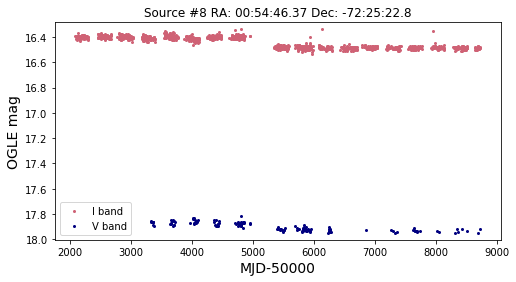

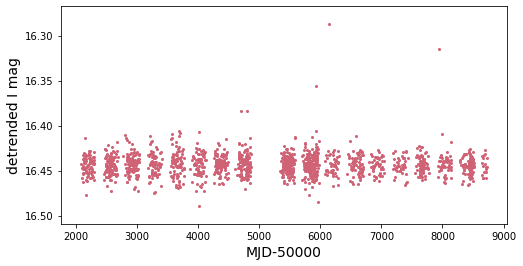

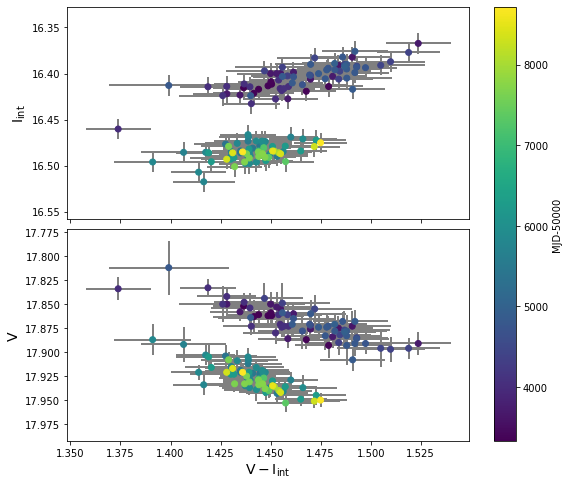

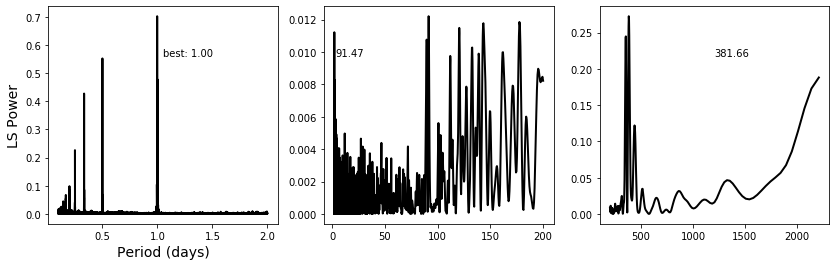

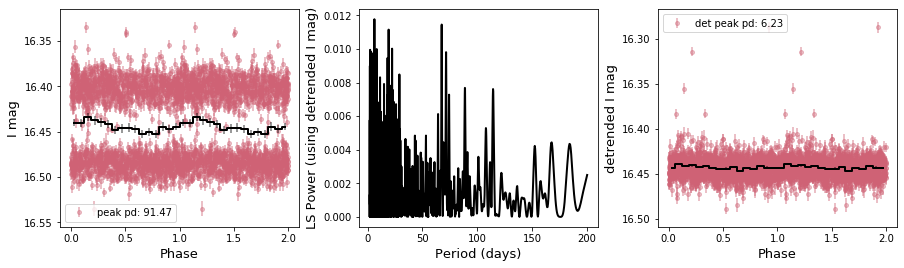

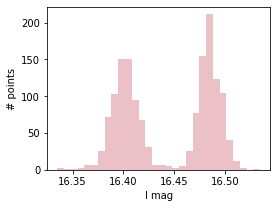

In [54]:
reload(o)
basic(1,pbins=16,saveall=save)

Source number: 19
RA,Dec (deg): 12.29786, -72.82671
Established period: 17.79
NS spin period: 18.37
Separation: 1.0999411508632648
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.9634952657054523
V and V-I correlation: -0.9179149262819041
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 35


max I band:  16.005
min I band:  14.785
I range:  1.2199999999999989
I stdev:  0.39559407501244287
max V band:  16.064
min V band:  15.201
V range:  0.8629999999999995
V stdev:  0.2511608658236033


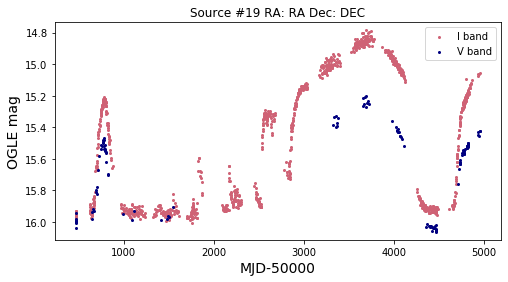

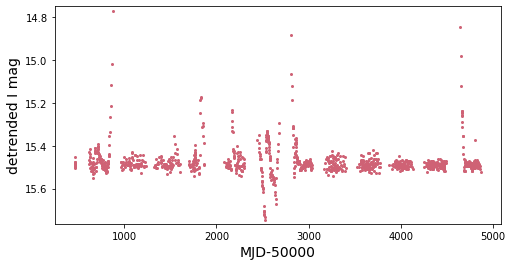

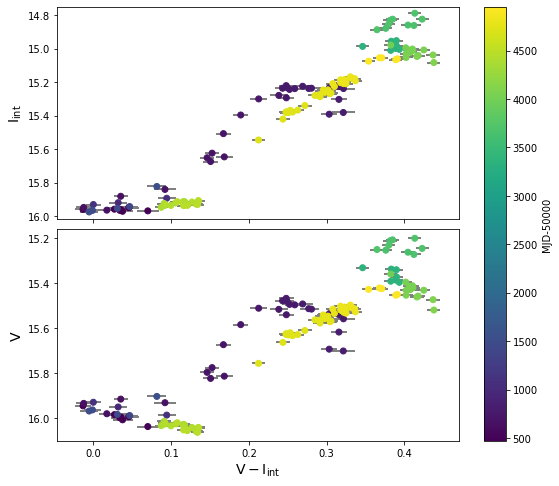

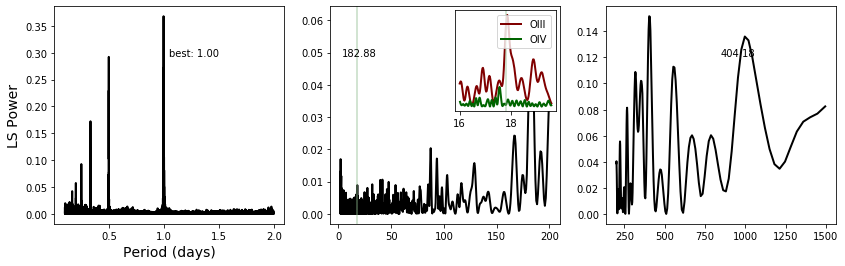

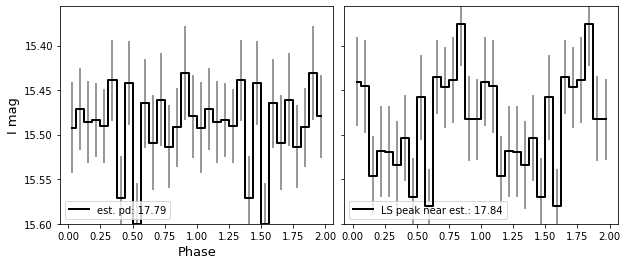

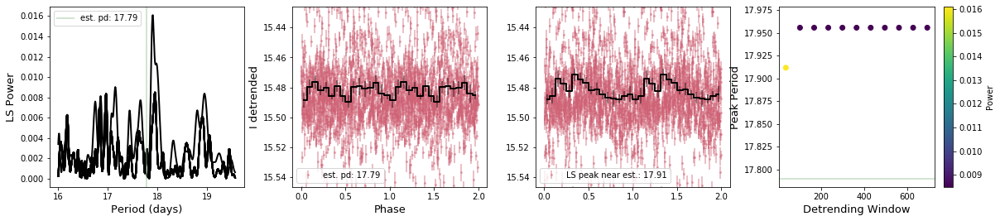

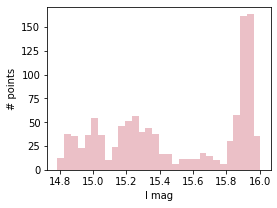

In [55]:
#has spin period?
basic(2,pbins=16,saveall=save)

In [43]:
# basic(3,pbins=16,saveall=save)

Source number: 61
RA,Dec (deg): 12.373937, -73.18304
Established period: 91.5
NS spin period: 894.0
Separation: 0.2781968914149977
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: 0.011100182905325186
V and V-I correlation: 0.617853792790458
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 183


max I band:  16.001
min I band:  15.87
I range:  0.131000000000002
I stdev:  0.02200551260199458
max V band:  16.355
min V band:  16.187
V range:  0.16799999999999926
V stdev:  0.030626815644909648


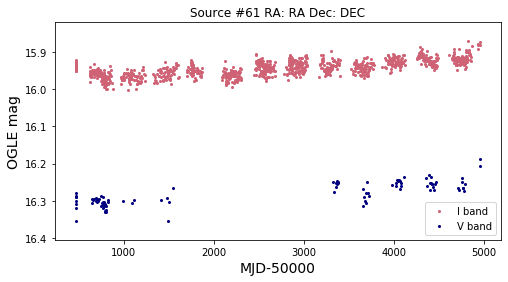

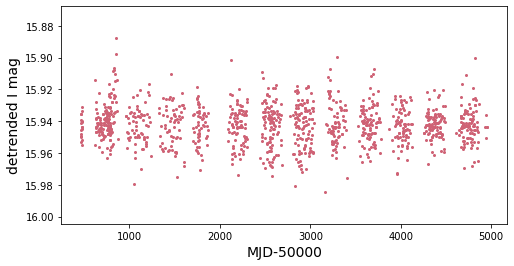

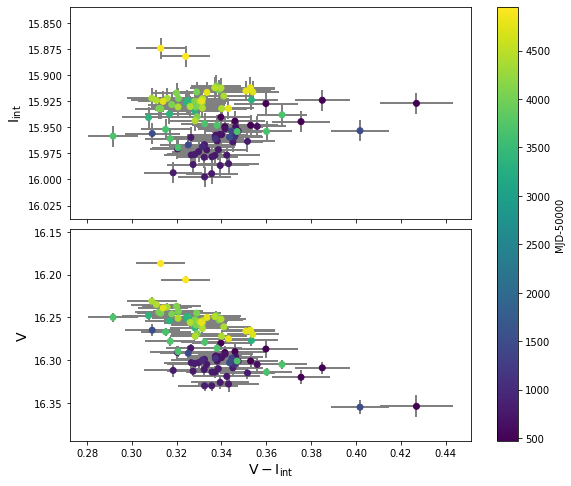

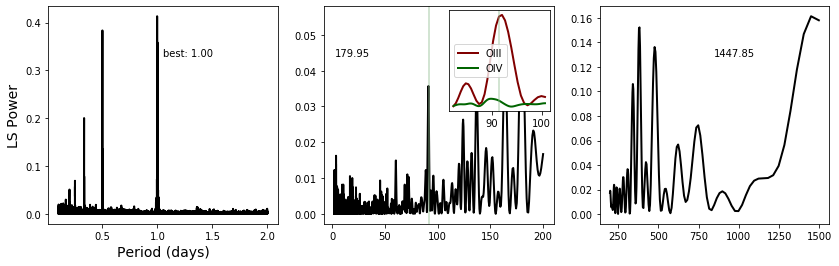

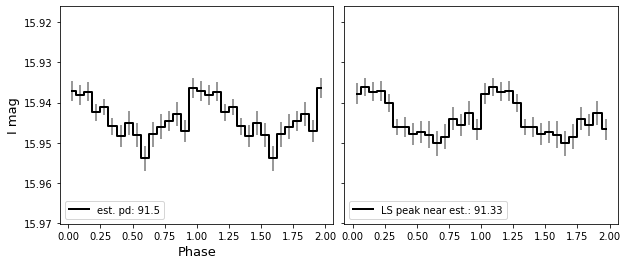

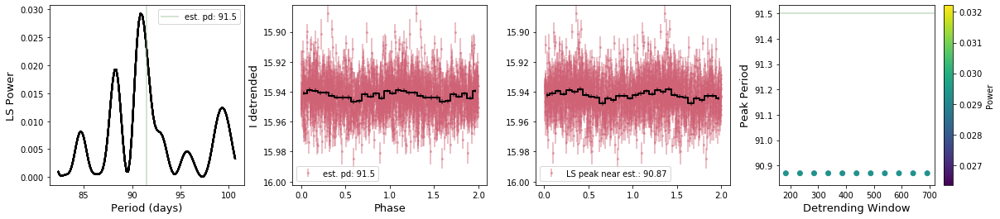

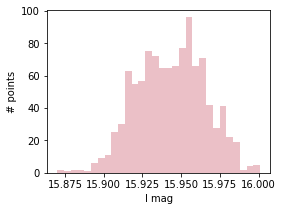

In [56]:
basic(4,pbins=16,saveall=save)

Source number: 67
RA,Dec (deg): 10.532371, -73.75095
Established period: nan
NS spin period: nan
Separation: 1.4710400317317927
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.32756498369748815
V and V-I correlation: 0.10889980040748493
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  17.125
min I band:  16.67
I range:  0.4549999999999983
I stdev:  0.11966109571992009
max V band:  17.063
min V band:  16.183
V range:  0.879999999999999
V stdev:  0.12036219692191123


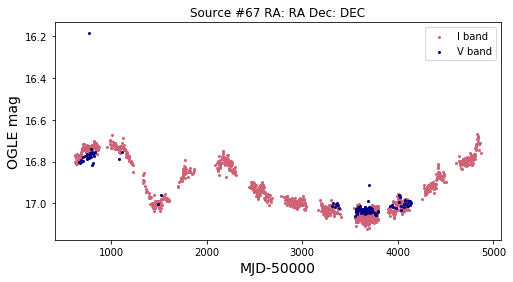

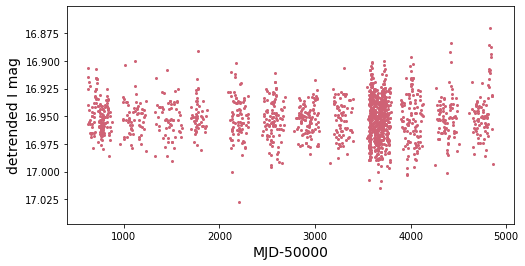

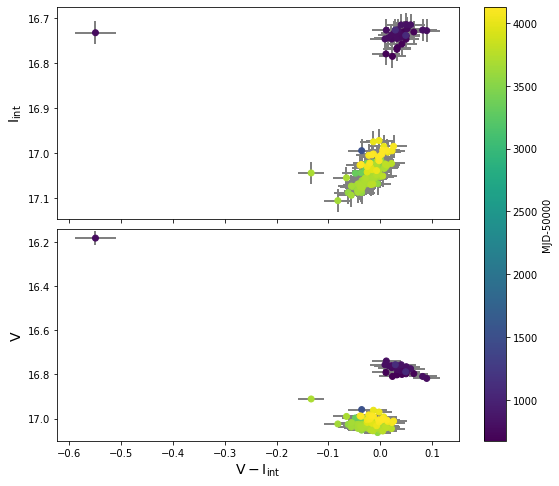

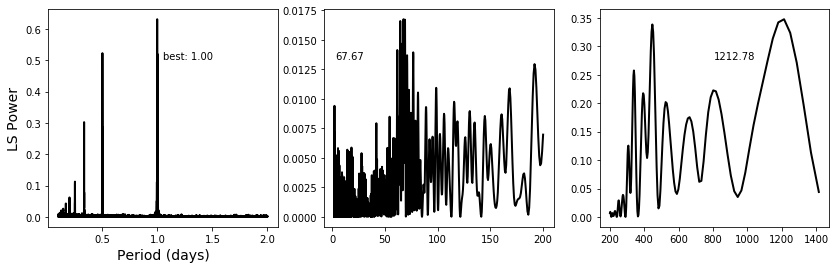

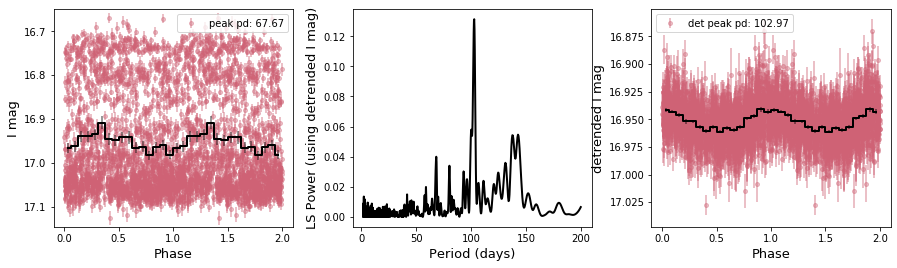

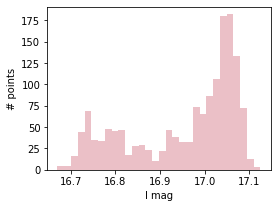

In [57]:
basic(5,pbins=16,saveall=save)

Source number: 68
RA,Dec (deg): 10.816116, -73.410904
Established period: nan
NS spin period: nan
Separation: 2.8205668840631937
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.6056653161259252
V and V-I correlation: 0.08561860739395792
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.937
min I band:  16.747
I range:  0.19000000000000128
I stdev:  0.0241925049933687
max V band:  16.793
min V band:  16.705
V range:  0.08800000000000097
V stdev:  0.01902582761742439


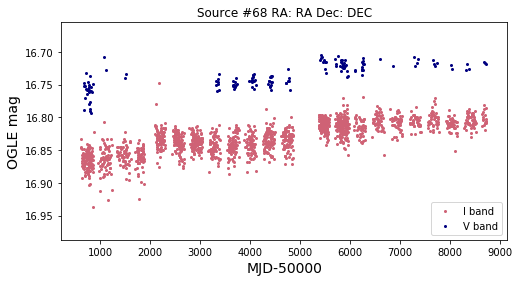

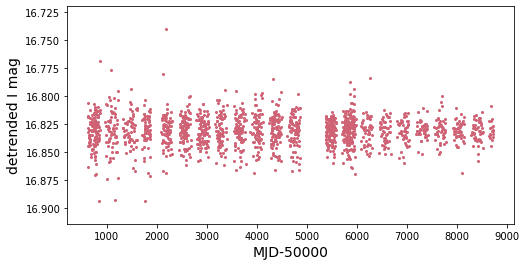

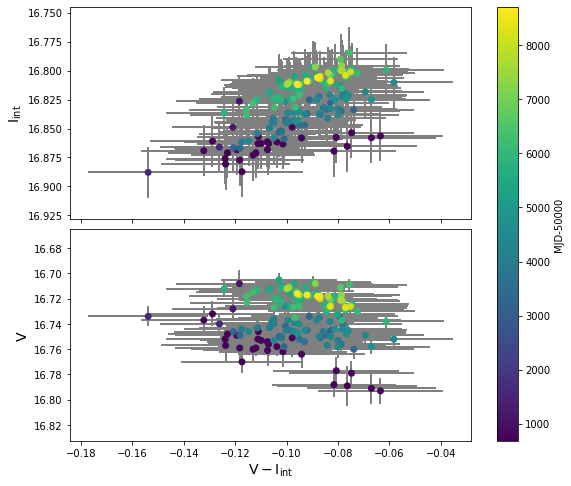

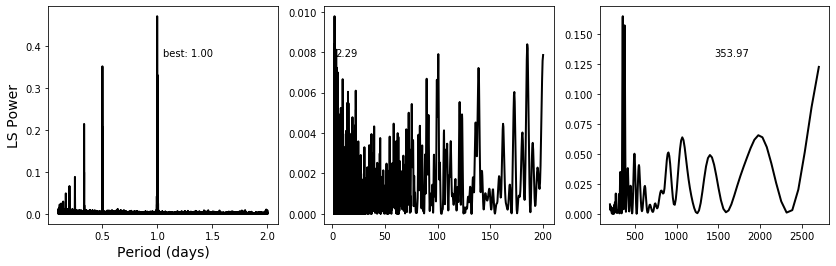

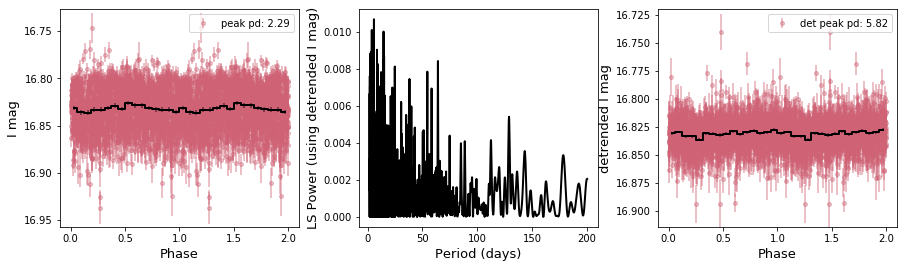

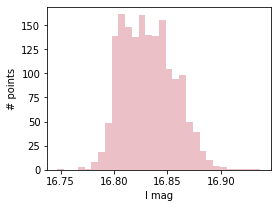

In [58]:
basic(6,pbins=16,saveall=save)

so far, many with less (super-orbital) variability

Source number: 69
RA,Dec (deg): 11.250834, -73.71298
Established period: nan
NS spin period: nan
Separation: 1.64945348111386
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.8816222525107474
V and V-I correlation: 0.15610819642368973
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.605
min I band:  15.472
I range:  0.1330000000000009
I stdev:  0.01631275109631154
max V band:  15.652
min V band:  15.609
V range:  0.04299999999999926
V stdev:  0.0071714085329187965


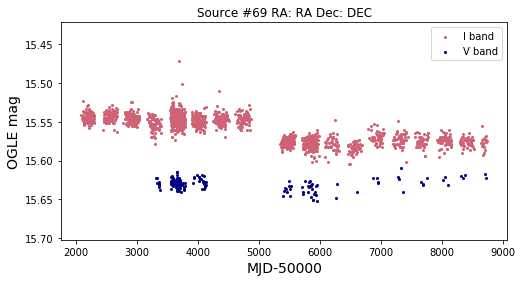

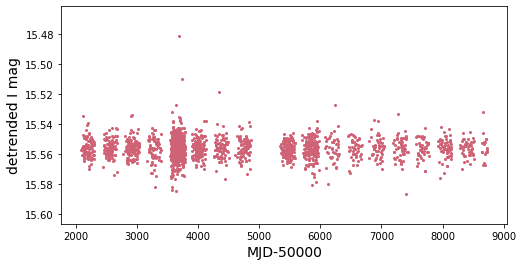

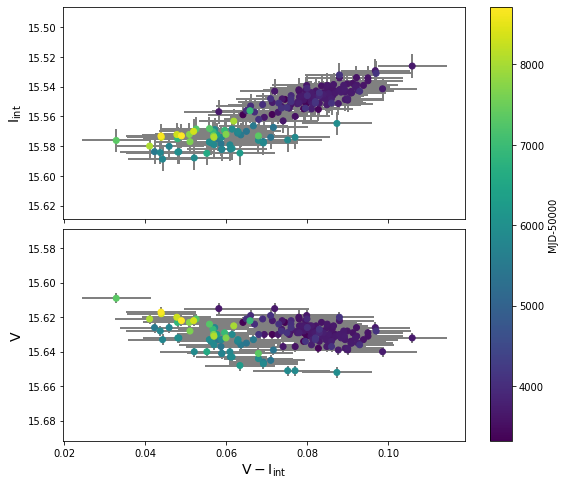

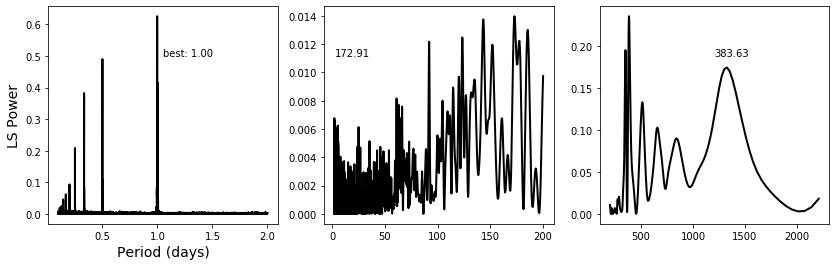

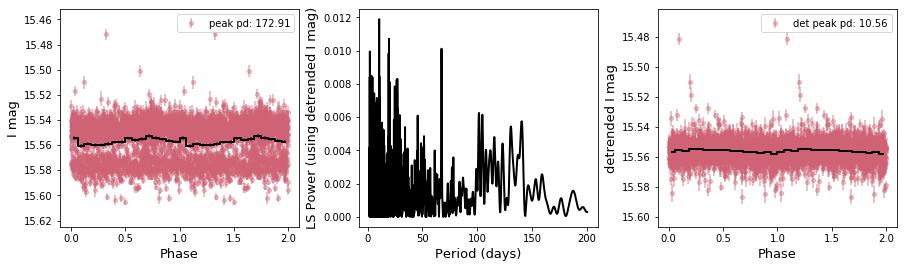

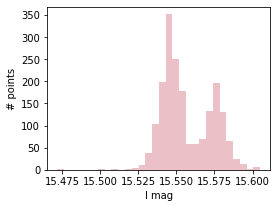

In [59]:
basic(7,pbins=16,saveall=save) #check calibration

Source number: 71
RA,Dec (deg): 12.078058, -73.34998
Established period: nan
NS spin period: nan
Separation: 0.0431108040365839
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.5152587908033422
V and V-I correlation: 0.5328754325752675
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.845
min I band:  16.599
I range:  0.24599999999999866
I stdev:  0.023369274424883405
max V band:  16.679
min V band:  16.501
V range:  0.17799999999999727
V stdev:  0.02554246659976291


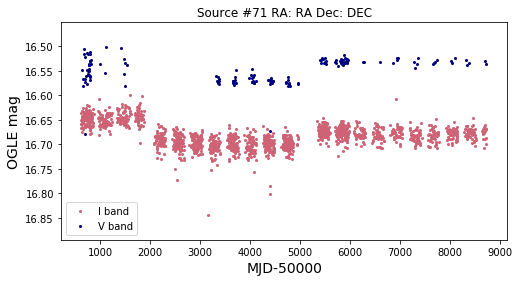

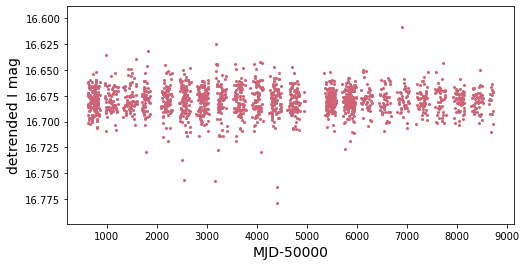

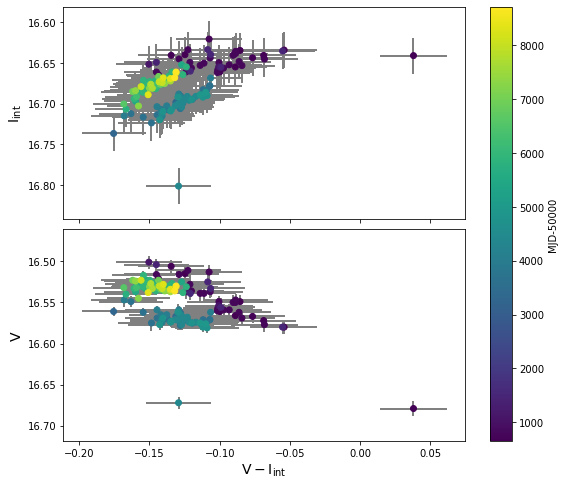

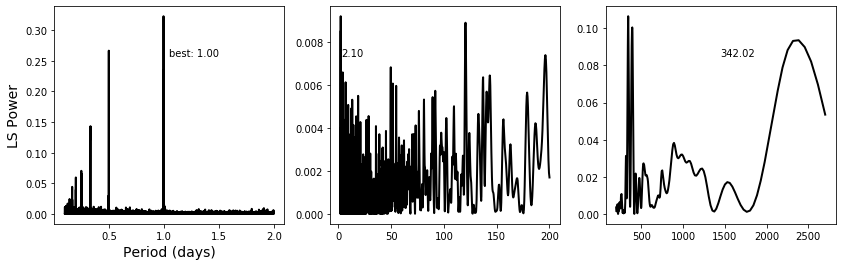

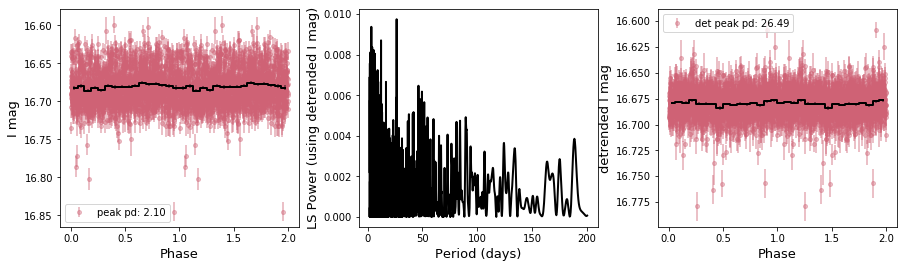

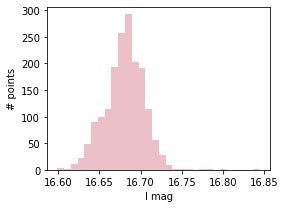

In [60]:
basic(8,pbins=16,saveall=save) #check calibration

In [50]:
# basic(9,pbins=16,saveall=save)

Source number: 73
RA,Dec (deg): 12.204167, -73.27361
Established period: nan
NS spin period: nan
Separation: 1.7438400173472062
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.8124872651805103
V and V-I correlation: 0.3205025098677481
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.444
min I band:  14.214
I range:  0.23000000000000043
I stdev:  0.044759233557362776
max V band:  14.601
min V band:  14.453
V range:  0.14800000000000146
V stdev:  0.02588635203063326


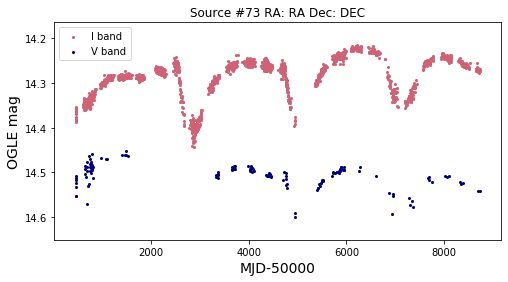

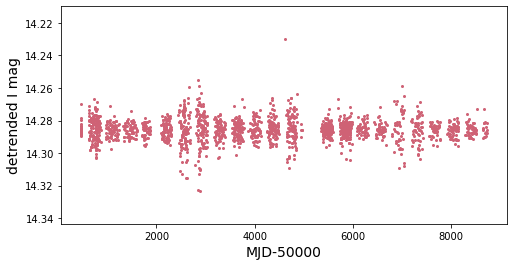

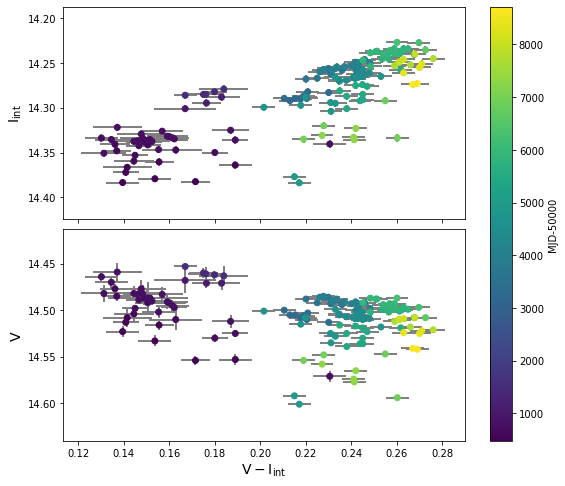

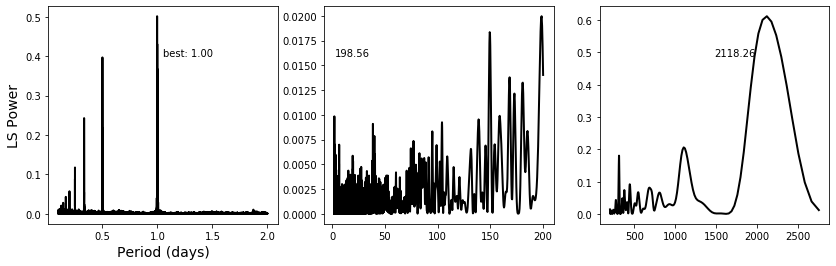

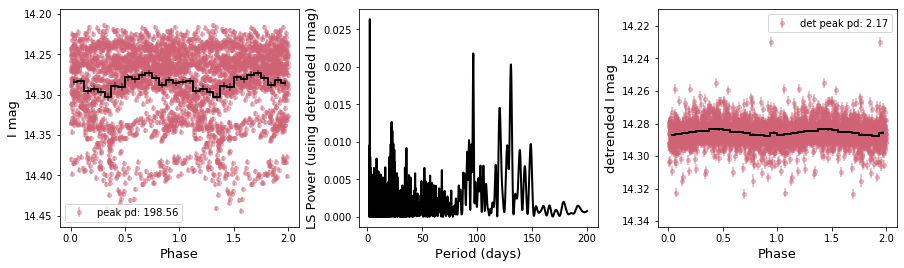

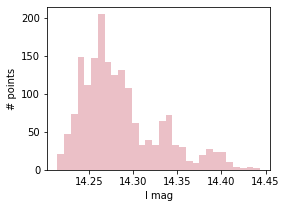

In [61]:
basic(10,pbins=16,saveall=save)

### maybe add super-orbital peak if it's above a certain LS power threshold

Source number: 75
RA,Dec (deg): 12.306787, -73.1938
Established period: 80.1
NS spin period: nan
Separation: 0.707051444753511
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.932428467980274
V and V-I correlation: -0.2515816687525331
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 161


max I band:  16.469
min I band:  16.012
I range:  0.45700000000000074
I stdev:  0.08472090375763396
max V band:  16.59
min V band:  16.431
V range:  0.15899999999999892
V stdev:  0.031157660911993436


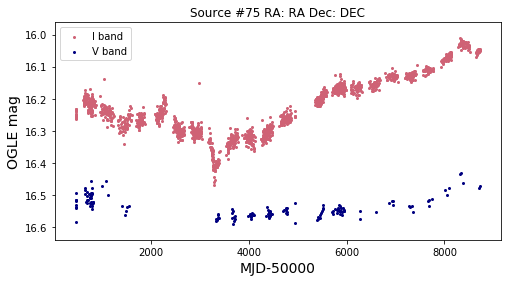

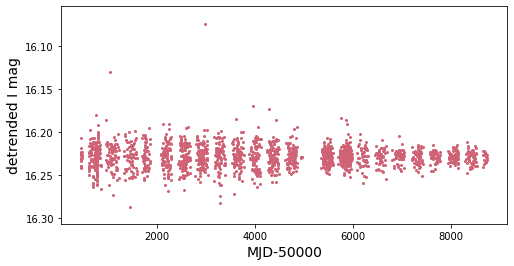

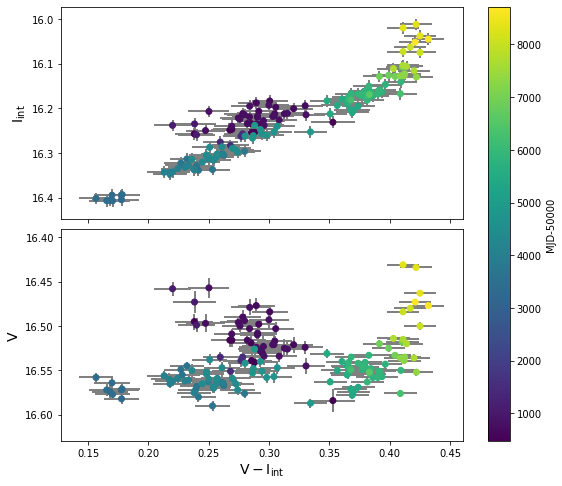

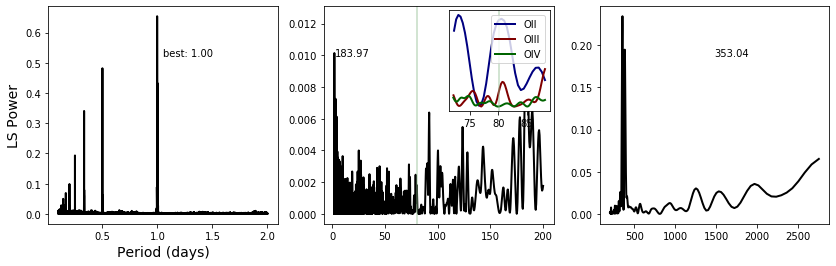

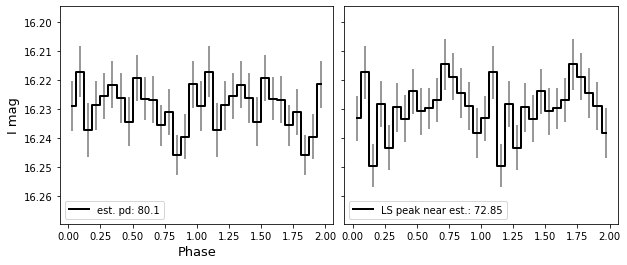

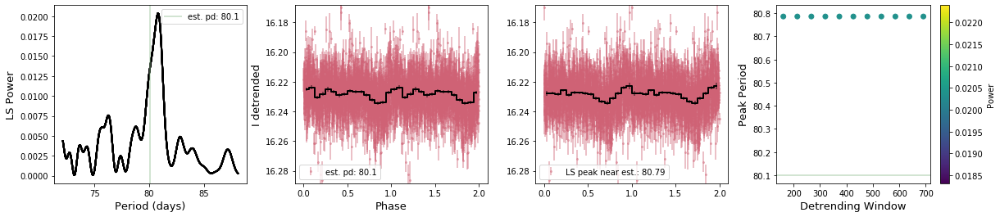

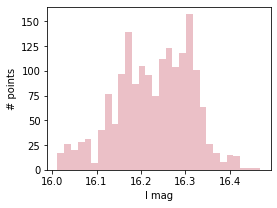

In [62]:
basic(11,pbins=16,saveall=save)

Source number: 76
RA,Dec (deg): 12.3425, -73.335
Established period: nan
NS spin period: nan
Separation: 1.5777340571430303
['OII I', 'OIII I', 'OIV I']
I and V-I correlation: -0.6224314088928621
V and V-I correlation: 0.7890592847402814
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  17.007
min I band:  16.816
I range:  0.1910000000000025
I stdev:  0.018185803201873844
max V band:  16.969
min V band:  16.785
V range:  0.18400000000000105
V stdev:  0.01951028029717706


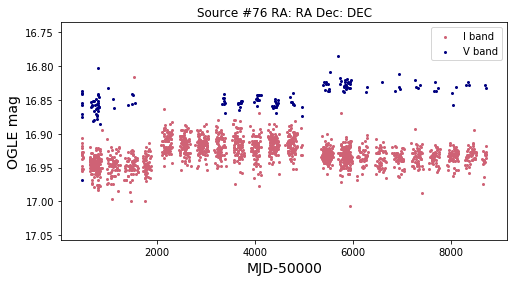

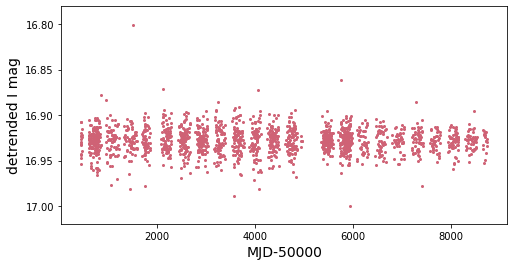

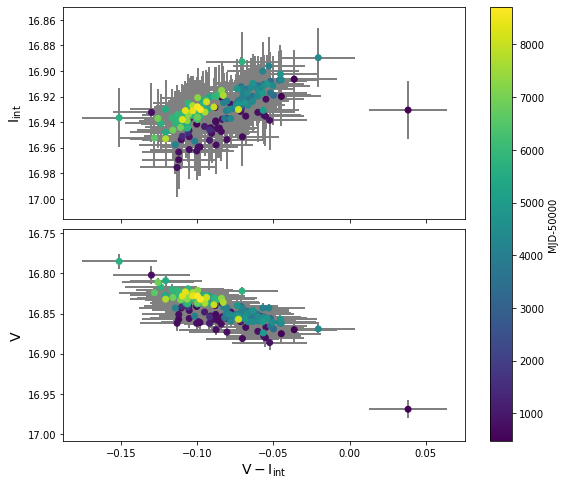

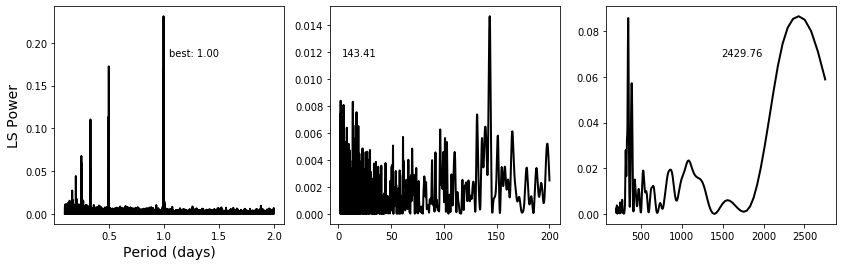

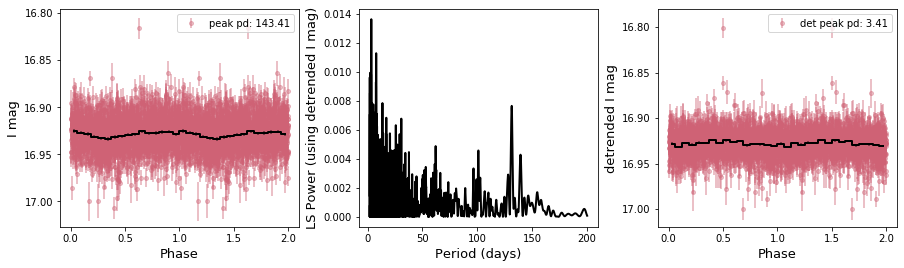

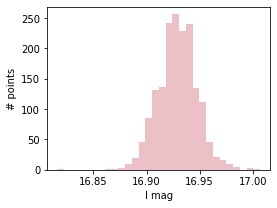

In [63]:
basic(12,pbins=16,saveall=save)

Source number: 77
RA,Dec (deg): 12.377575, -73.519264
Established period: nan
NS spin period: nan
Separation: 1.2890474967685142
I and V-I correlation: -0.3172205594085305
V and V-I correlation: 0.8271378581283982
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  23.915
min I band:  14.413
I range:  9.501999999999999
I stdev:  2.3787874835218146
max V band:  14.815
min V band:  14.611
V range:  0.20399999999999885
V stdev:  0.03163050566919346


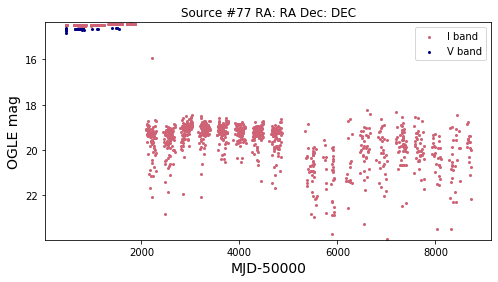

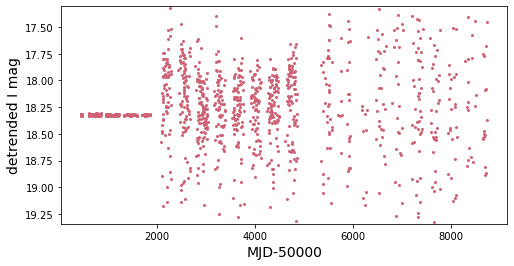

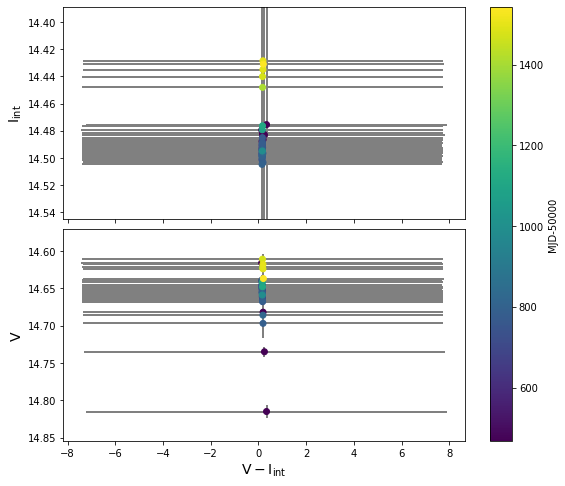

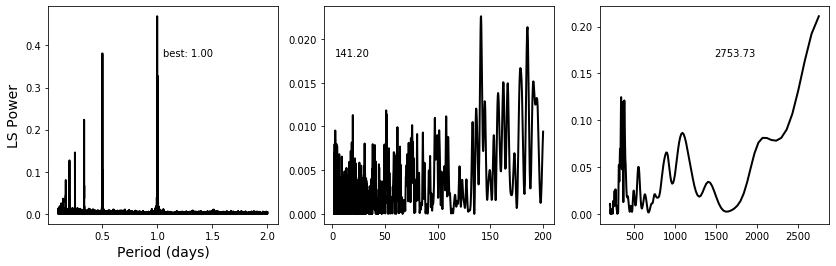

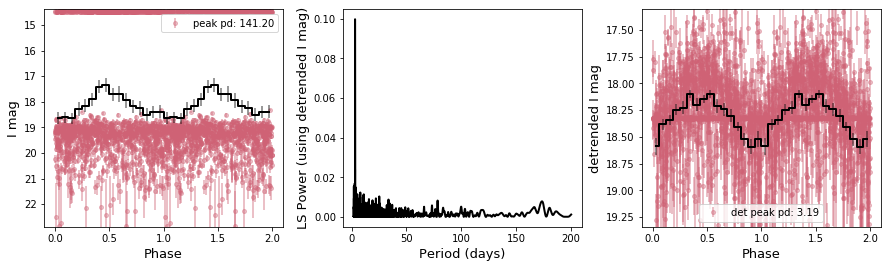

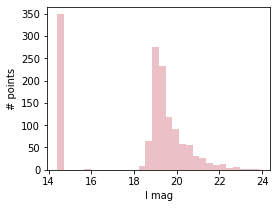

In [65]:
reload(o)
basic(13,pbins=16,saveall=save) #what's going on with points in the beginning?

Source number: 78
RA,Dec (deg): 12.423583, -72.81192
Established period: nan
NS spin period: nan
Separation: 1.4188226668631583
empty file for OII I
I and V-I correlation: nan
V and V-I correlation: 1.0
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  21.956
min I band:  18.431
I range:  3.5249999999999986
I stdev:  0.2606282234259651
max V band:  18.674
min V band:  17.258
V range:  1.4160000000000004
V stdev:  0.29850037508000304


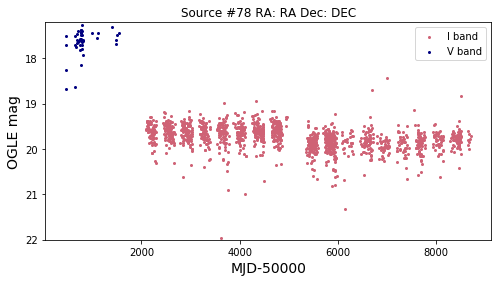

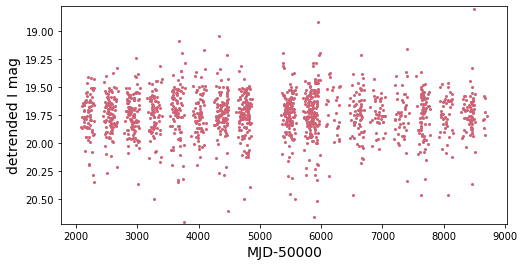

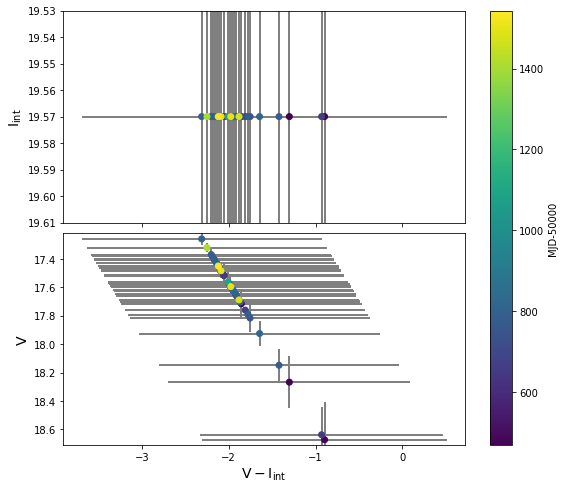

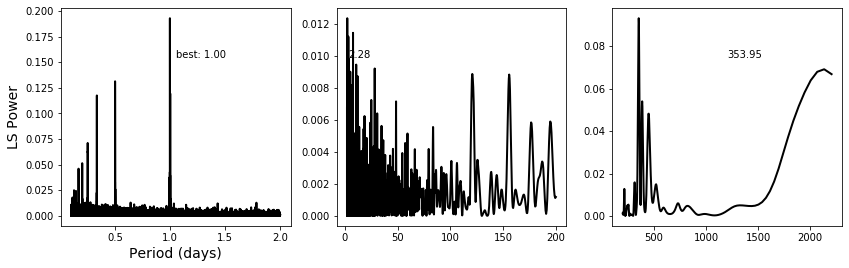

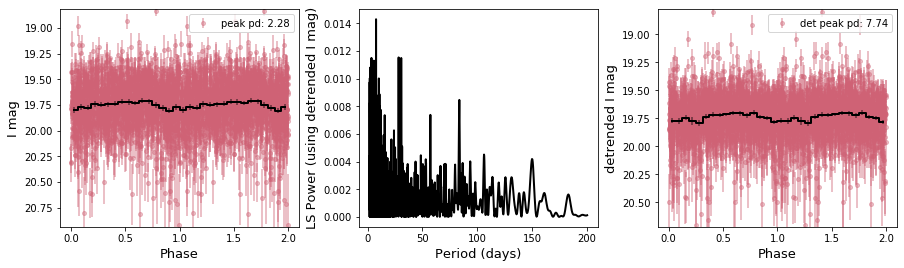

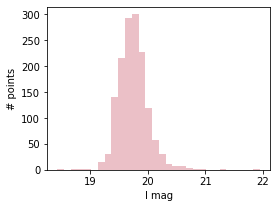

In [66]:
basic(14,pbins=16,saveall=save) 

#### check in on V-I error; maybe don't use max I error for interp I error, since that value may be quite high because of one outlier

Source number: 79
RA,Dec (deg): 12.518333, -73.240555
Established period: nan
NS spin period: nan
Separation: 0.8130891502035685
I and V-I correlation: -0.14960268017224718
V and V-I correlation: 0.9182068428667877
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.778
min I band:  15.601
I range:  0.1769999999999996
I stdev:  0.02284122277262935
max V band:  16.045
min V band:  15.635
V range:  0.4100000000000019
V stdev:  0.054455324808507136


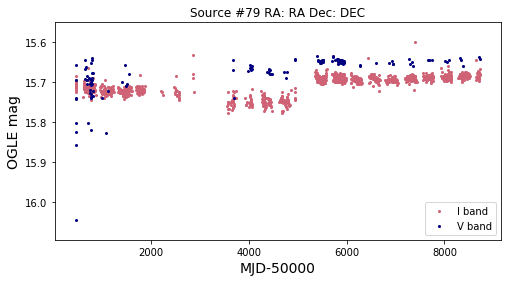

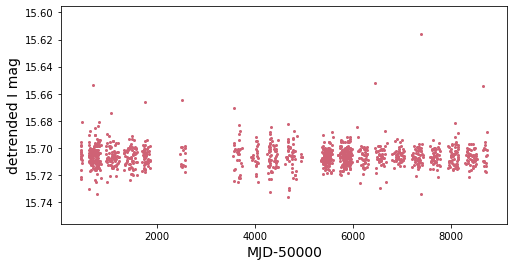

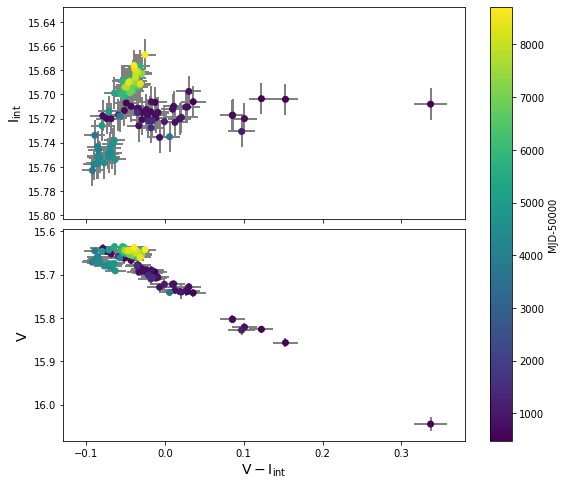

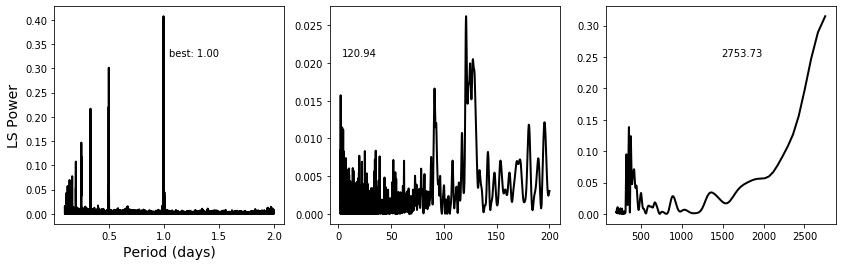

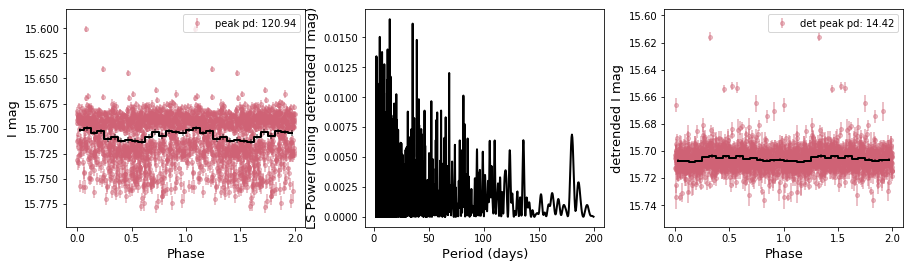

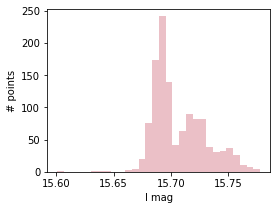

In [67]:
basic(15,pbins=16,saveall=save) #check calibration

Source number: 80
RA,Dec (deg): 12.550833, -73.19889
Established period: nan
NS spin period: nan
Separation: nan
I and V-I correlation: -0.7418541628472648
V and V-I correlation: -0.4623167530237583
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.966
min I band:  15.03
I range:  0.9359999999999999
I stdev:  0.22031571872294575
max V band:  16.002
min V band:  15.363
V range:  0.6389999999999993
V stdev:  0.14682643541246457


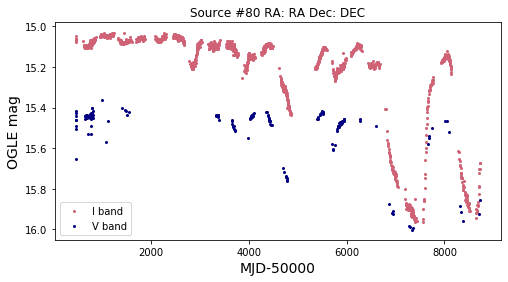

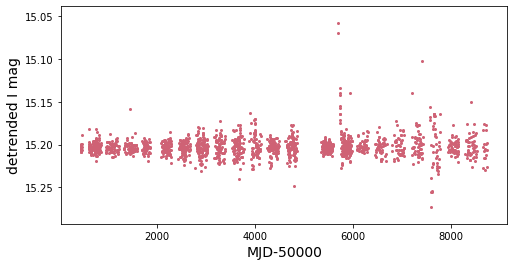

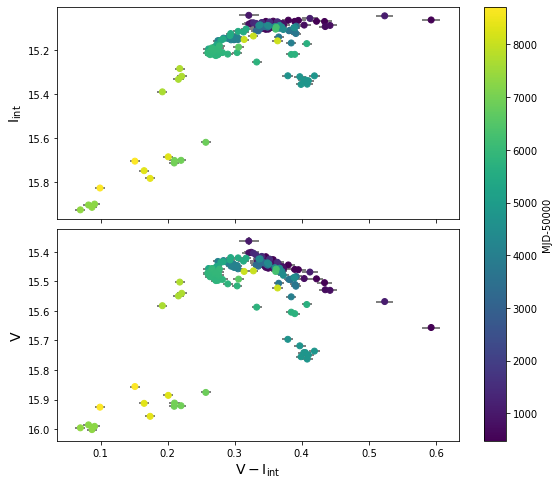

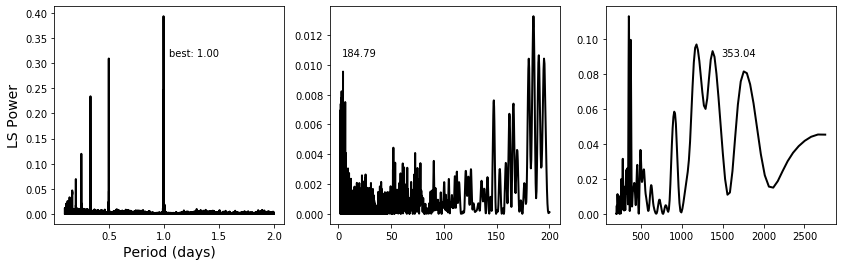

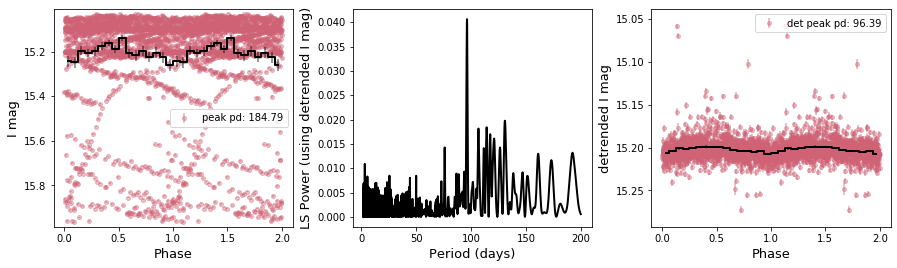

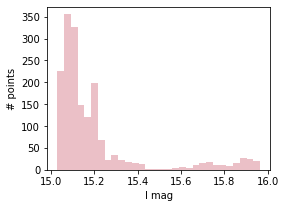

In [69]:
basic(16,pbins=16,saveall=save) #changing amplitude

Source number: 81
RA,Dec (deg): 12.647917, -73.23361
Established period: nan
NS spin period: nan
Separation: 1.4965820370445162
I and V-I correlation: -0.6531488376001429
V and V-I correlation: 0.48133738050846325
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.115
min I band:  15.858
I range:  0.2569999999999979
I stdev:  0.033862081612830226
max V band:  16.249
min V band:  16.108
V range:  0.14099999999999824
V stdev:  0.02675744209741014


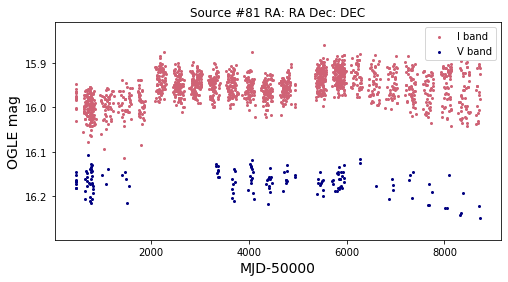

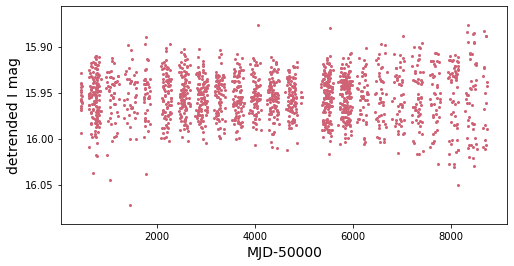

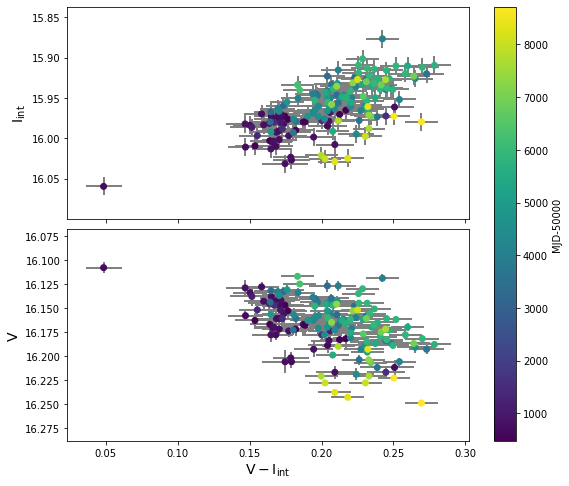

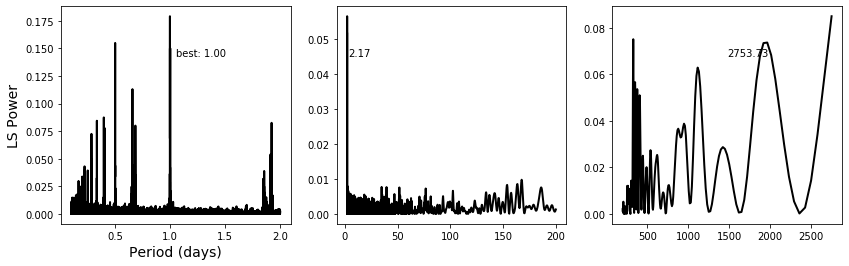

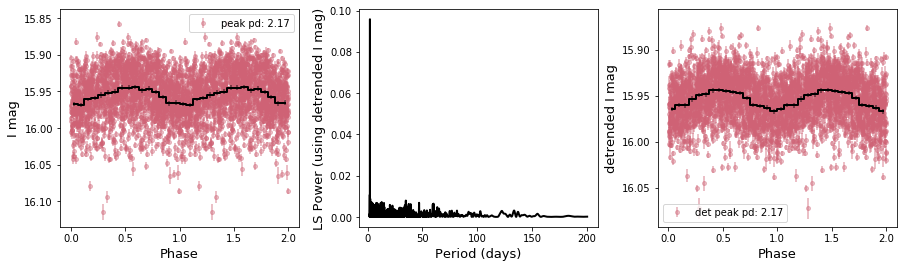

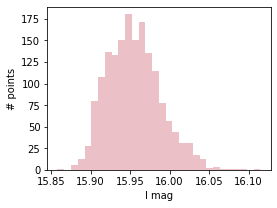

In [70]:
basic(17,pbins=16,saveall=save) 

Source number: 82
RA,Dec (deg): 12.65, -73.29417
Established period: nan
NS spin period: nan
Separation: 0.5274558714263263
I and V-I correlation: -0.7090734863991222
V and V-I correlation: 0.27675601329126126
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.566
min I band:  15.395
I range:  0.17100000000000115
I stdev:  0.027816829860183457
max V band:  15.859
min V band:  15.695
V range:  0.1639999999999997
V stdev:  0.02134780903052321


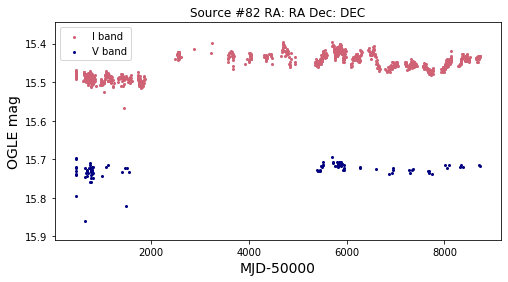

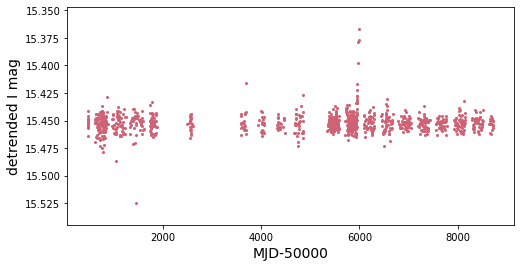

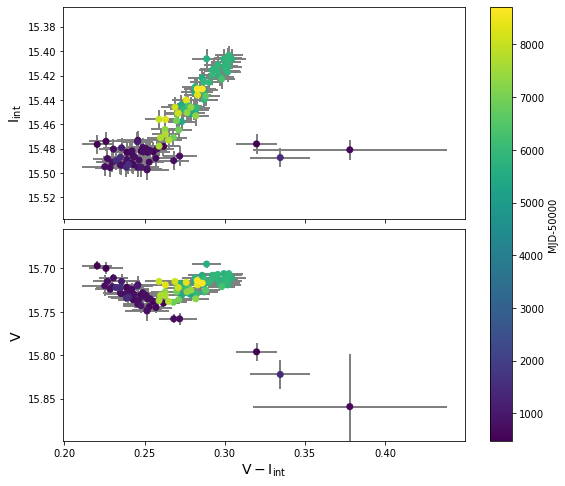

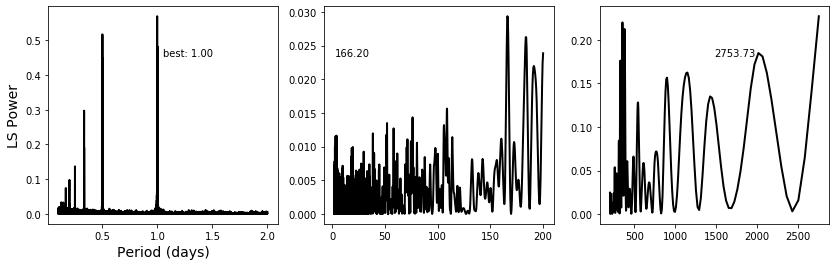

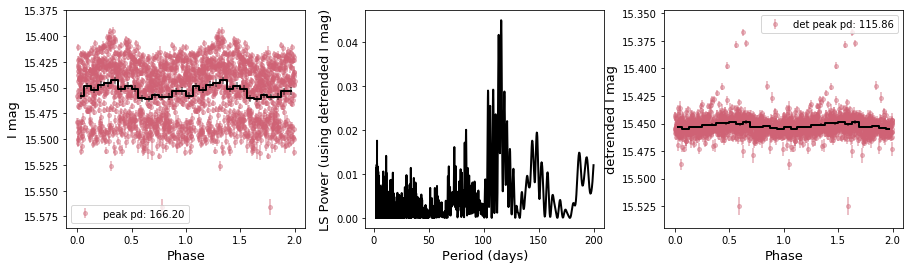

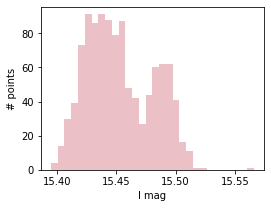

In [71]:
basic(18,pbins=16,saveall=save)

Source number: 84
RA,Dec (deg): 12.699167, -73.293335
Established period: nan
NS spin period: nan
Separation: 0.5527096967798616
I and V-I correlation: -0.6677604520225899
V and V-I correlation: -0.17855315315375467
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.704
min I band:  16.367
I range:  0.33699999999999974
I stdev:  0.051525214878432084
max V band:  16.744
min V band:  16.533
V range:  0.21099999999999852
V stdev:  0.044261874737648844


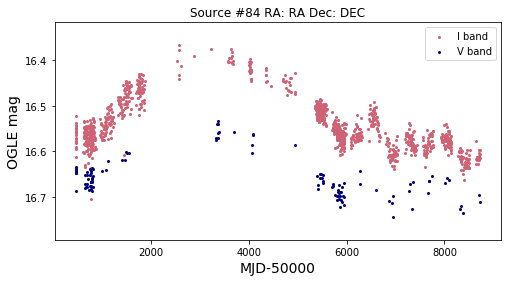

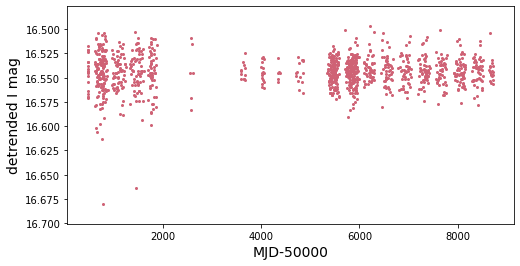

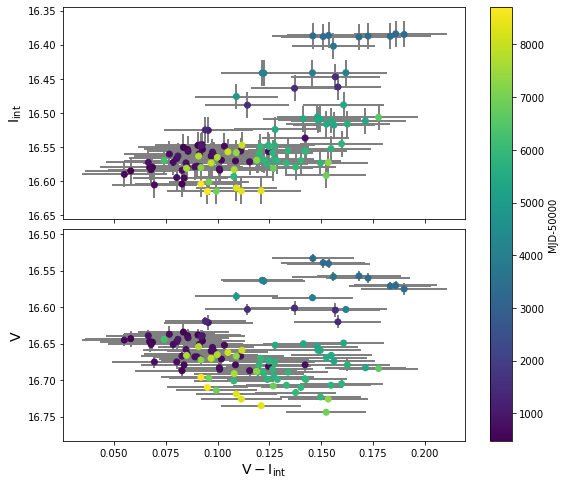

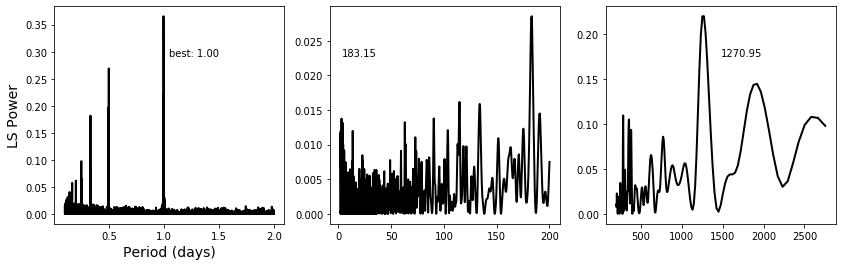

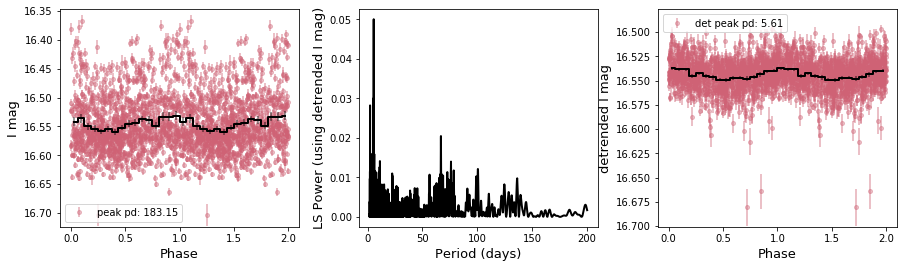

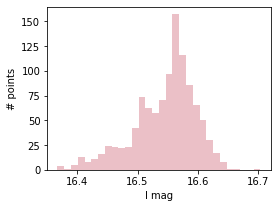

In [72]:
basic(19,pbins=16,saveall=save)

Source number: 85
RA,Dec (deg): 12.738696, -73.168884
Established period: nan
NS spin period: nan
Separation: 0.5087102650552437
I and V-I correlation: -0.8564583967944337
V and V-I correlation: 0.06680177775356583
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.438
min I band:  14.321
I range:  0.11700000000000088
I stdev:  0.02206041843459092
max V band:  14.573
min V band:  14.507
V range:  0.06600000000000072
V stdev:  0.010348805397386113


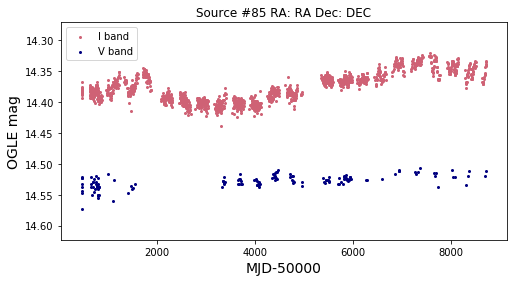

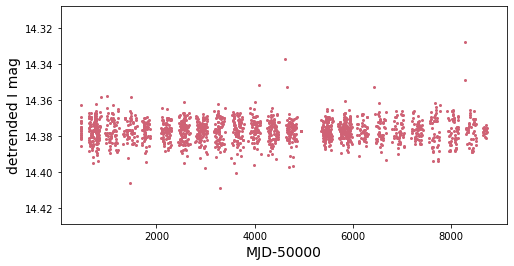

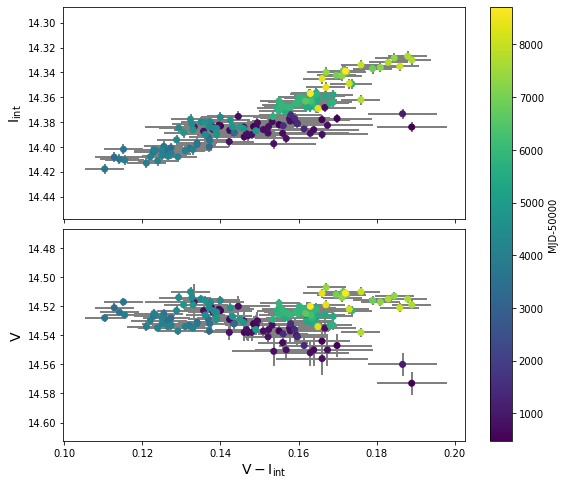

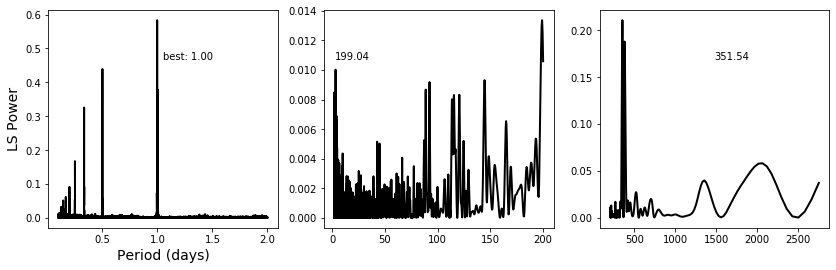

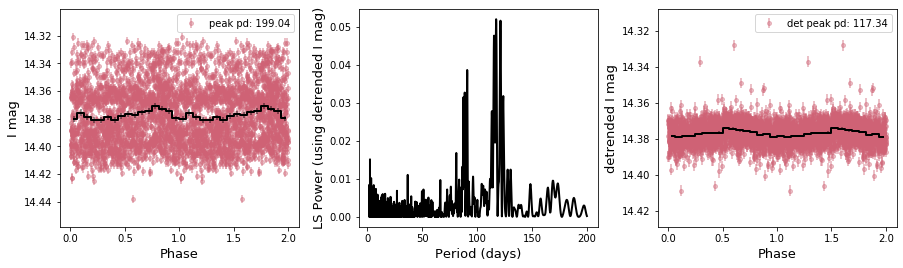

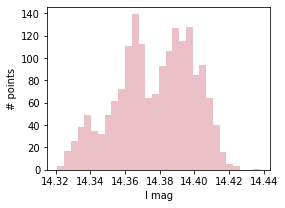

In [73]:
basic(20,pbins=16,saveall=save) #look into super-orbital peak

Source number: 86
RA,Dec (deg): 12.77375, -73.22
Established period: nan
NS spin period: nan
Separation: 0.3034814732763056
I and V-I correlation: -0.816913465563012
V and V-I correlation: -0.6878375612248163
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.906
min I band:  15.144
I range:  0.7620000000000005
I stdev:  0.19181405096468448
max V band:  15.962
min V band:  15.508
V range:  0.4540000000000006
V stdev:  0.15634246674998226


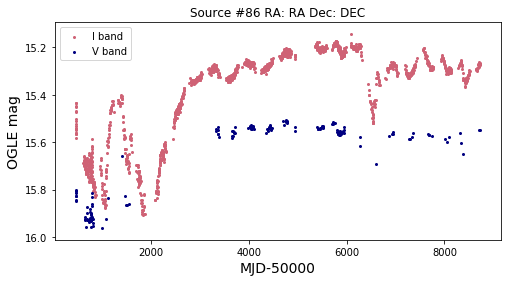

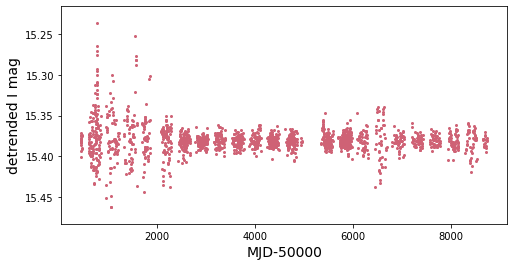

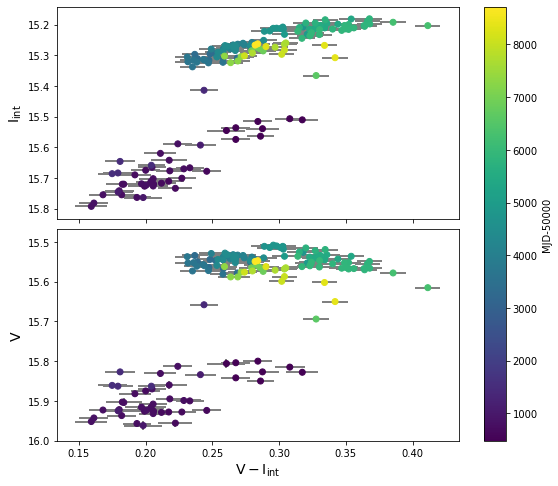

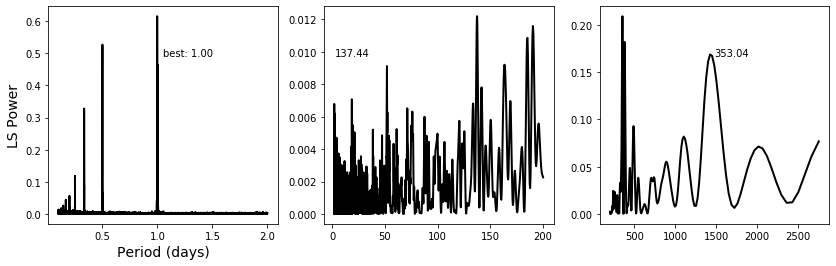

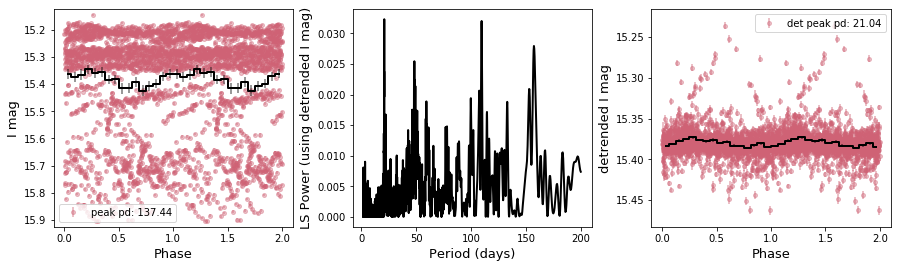

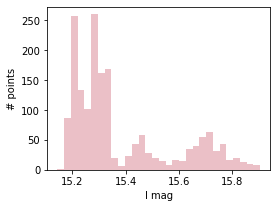

In [74]:
basic(21,pbins=16,saveall=save)

Source number: 87
RA,Dec (deg): 12.820833, -73.26833
Established period: nan
NS spin period: nan
Separation: 0.7322323111572513
I and V-I correlation: -0.8150152676339503
V and V-I correlation: -0.5866867635448035
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.926
min I band:  14.901
I range:  1.0250000000000004
I stdev:  0.27012718788969486
max V band:  15.801
min V band:  15.16
V range:  0.641
V stdev:  0.18845538797557349


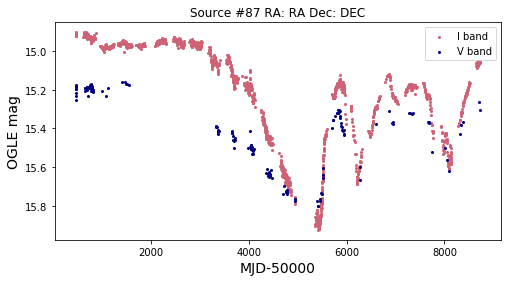

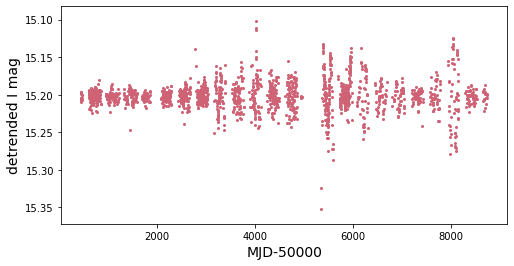

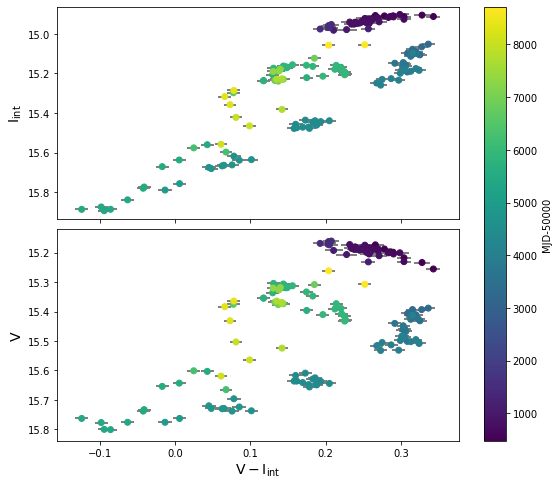

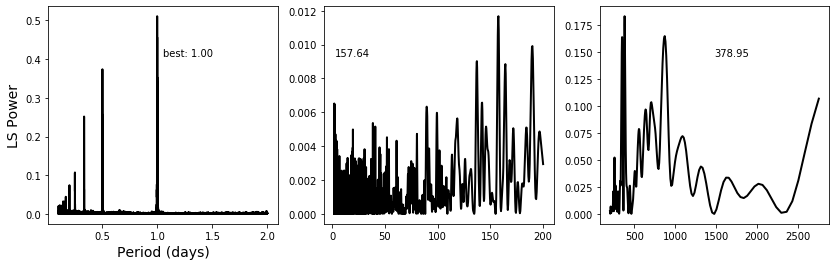

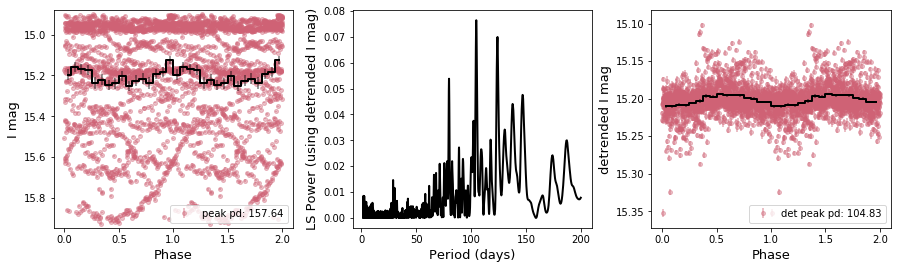

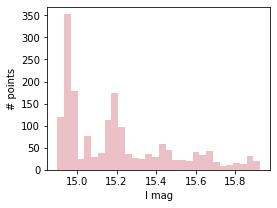

In [75]:
basic(22,pbins=16,saveall=save)

Source number: 93
RA,Dec (deg): 13.032346, -72.35717
Established period: nan
NS spin period: nan
Separation: 1.7089293054259382
I and V-I correlation: 0.5673176077609986
V and V-I correlation: 0.9691105340550913
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.367
min I band:  15.288
I range:  0.07900000000000063
I stdev:  0.008797416601058398
max V band:  15.287
min V band:  15.194
V range:  0.09299999999999997
V stdev:  0.030191178209422184


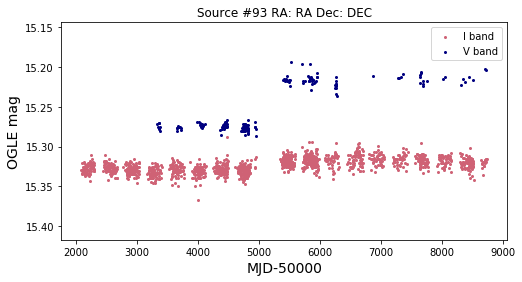

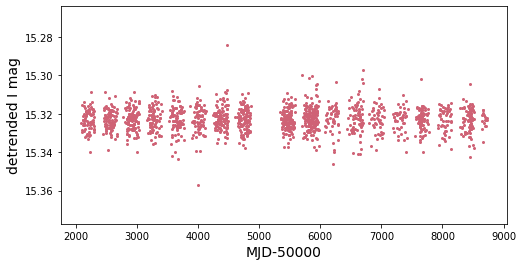

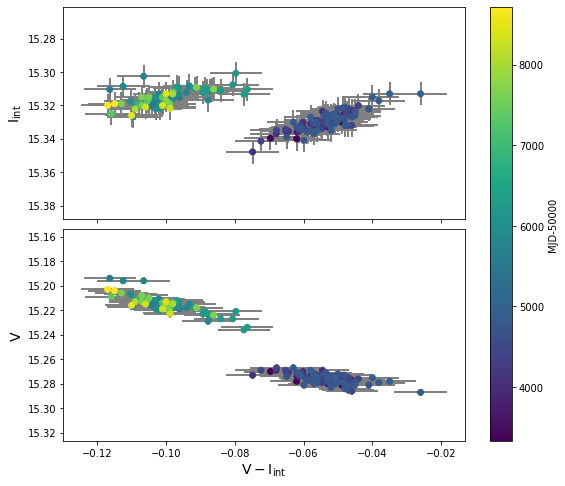

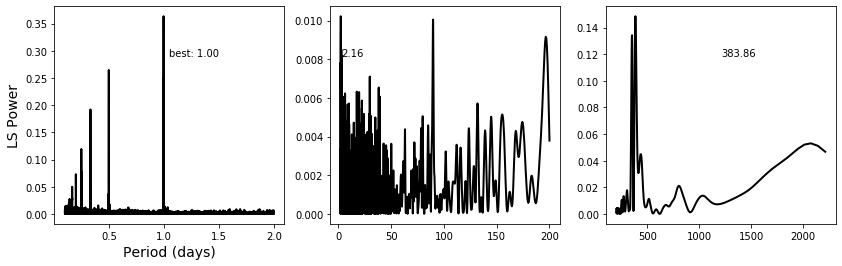

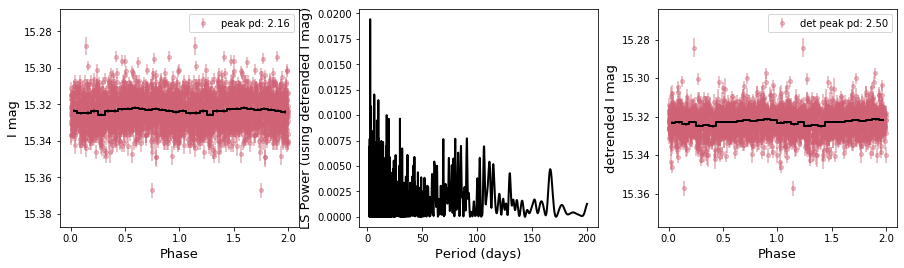

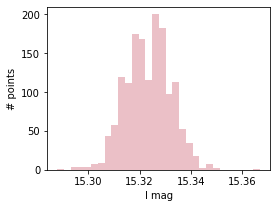

In [76]:
basic(23,pbins=16,saveall=save) #check calibration

Source number: 95
RA,Dec (deg): 13.155417, -72.458885
Established period: nan
NS spin period: nan
Separation: 0.5213547493498698
I and V-I correlation: -0.943471636775356
V and V-I correlation: -0.6588177630694824
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.889
min I band:  14.721
I range:  0.16799999999999926
I stdev:  0.03904534655330587
max V band:  15.053
min V band:  14.981
V range:  0.07200000000000095
V stdev:  0.016393001308739923


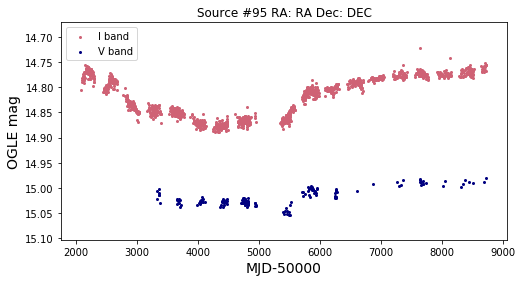

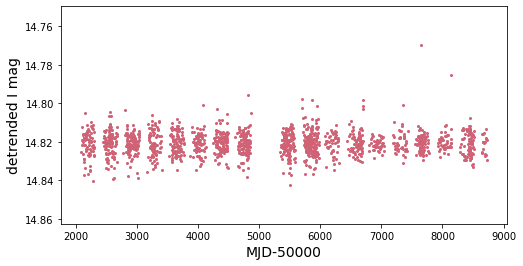

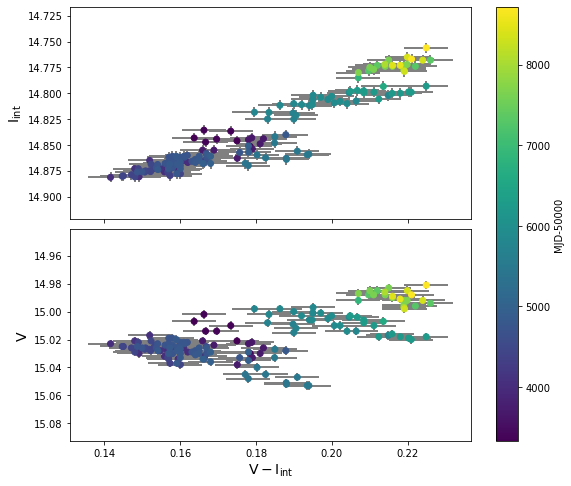

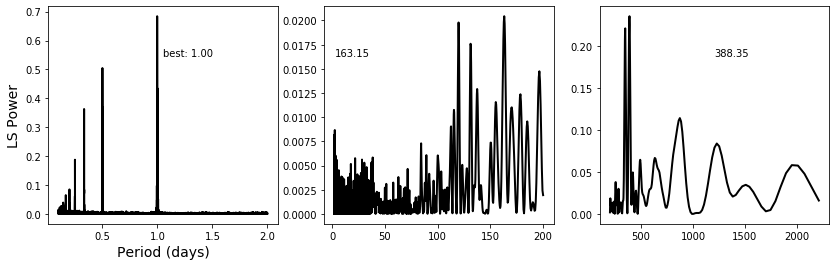

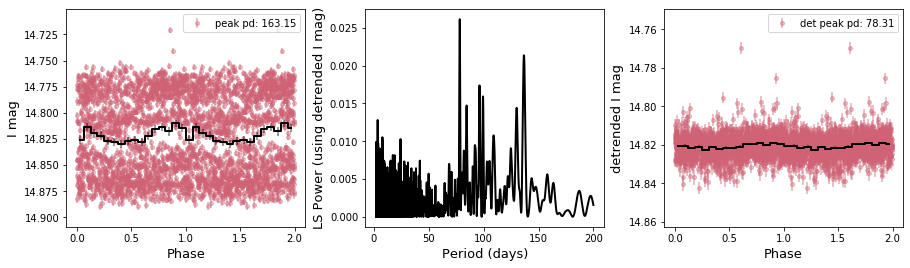

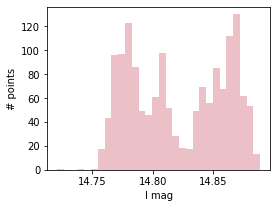

In [77]:
basic(24,pbins=16,saveall=save)

Source number: 96
RA,Dec (deg): 13.187667, -72.478775
Established period: nan
NS spin period: nan
Separation: 0.3227359863563713
I and V-I correlation: -0.5242624080645107
V and V-I correlation: -0.008505770124147301
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.991
min I band:  14.762
I range:  0.2289999999999992
I stdev:  0.03761252900932711
max V band:  15.015
min V band:  14.885
V range:  0.13000000000000078
V stdev:  0.029502959367501923


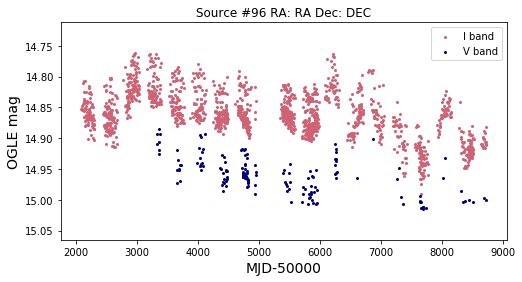

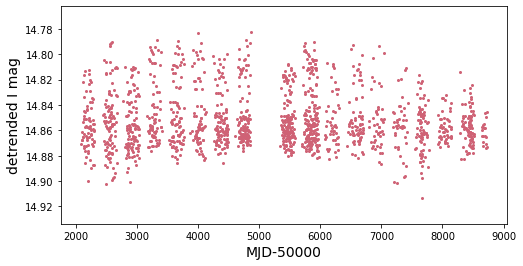

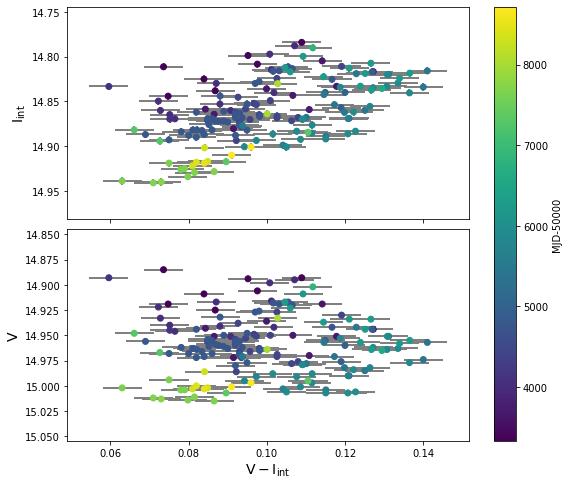

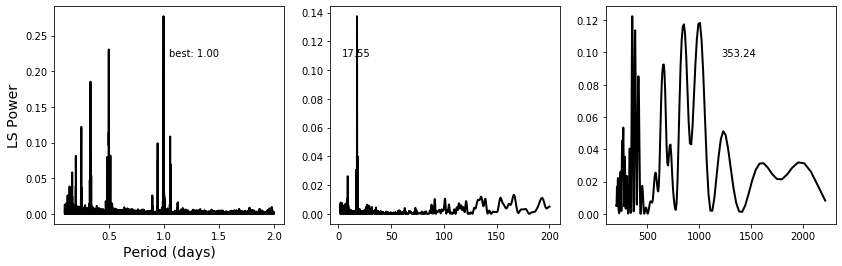

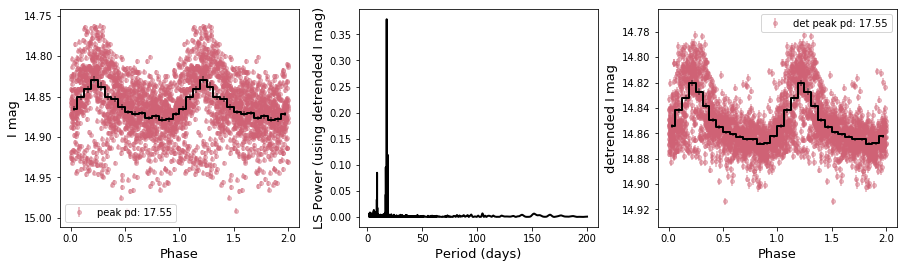

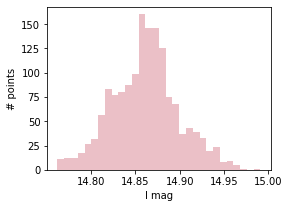

In [78]:
basic(25,pbins=16,saveall=save)

Source number: 97
RA,Dec (deg): 13.217584, -72.80828
Established period: nan
NS spin period: nan
Separation: 0.3714398207678562
I and V-I correlation: -0.9836267906610039
V and V-I correlation: -0.949454883045651
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.127
min I band:  14.187
I range:  0.9400000000000013
I stdev:  0.2933382931710367
max V band:  14.914
min V band:  14.33
V range:  0.5839999999999996
V stdev:  0.17087821036245526


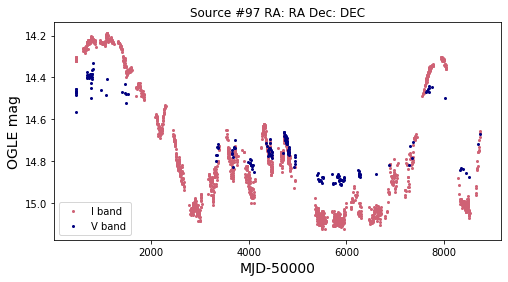

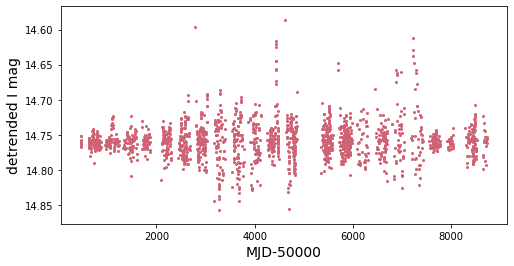

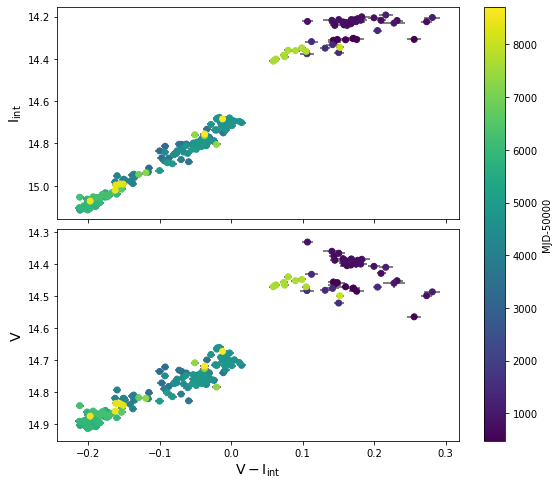

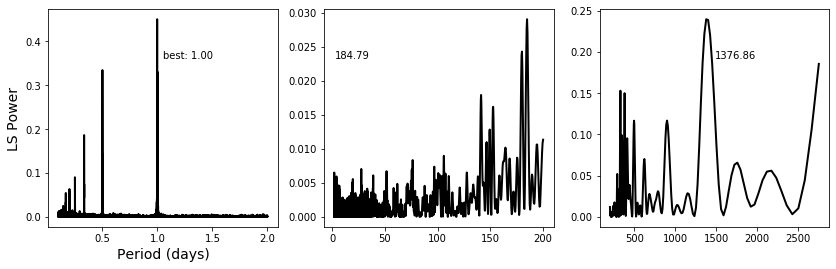

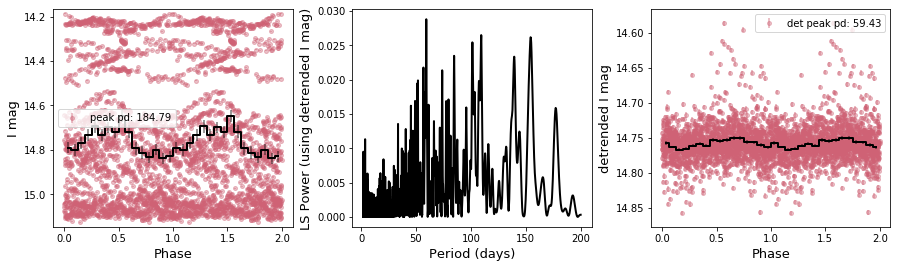

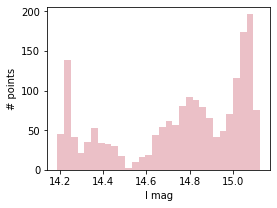

In [79]:
basic(26,pbins=16,saveall=save) #strong super-orbital peak

Source number: 98
RA,Dec (deg): 13.247778, -72.9006
Established period: nan
NS spin period: nan
Separation: 0.7278923479836363
I and V-I correlation: -0.2455623866494508
V and V-I correlation: 0.9978296132599885
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  17.301
min I band:  17.092
I range:  0.20899999999999963
I stdev:  0.019528380715445406
max V band:  20.71
min V band:  18.079
V range:  2.6310000000000002
V stdev:  0.32210589561004865


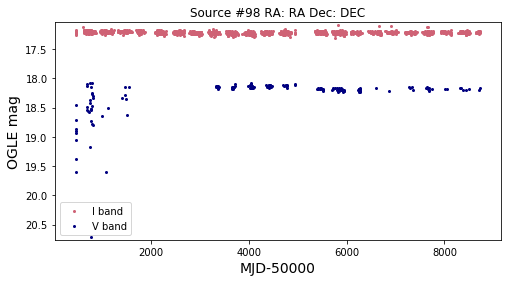

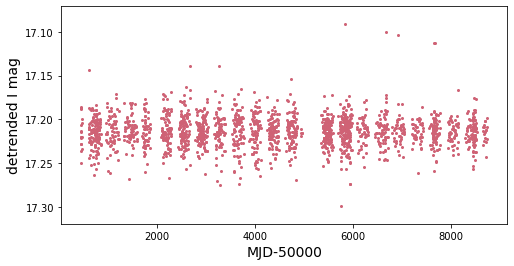

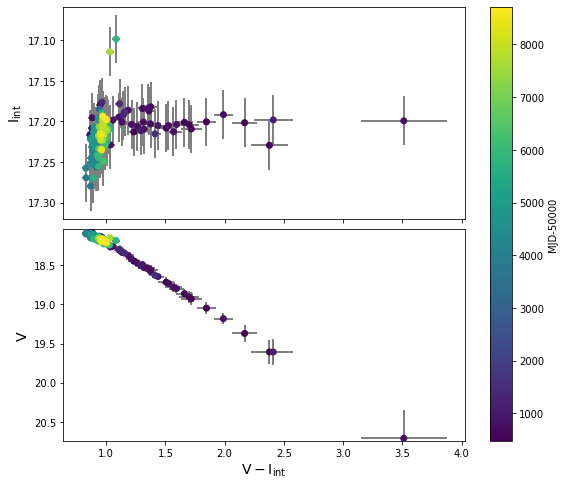

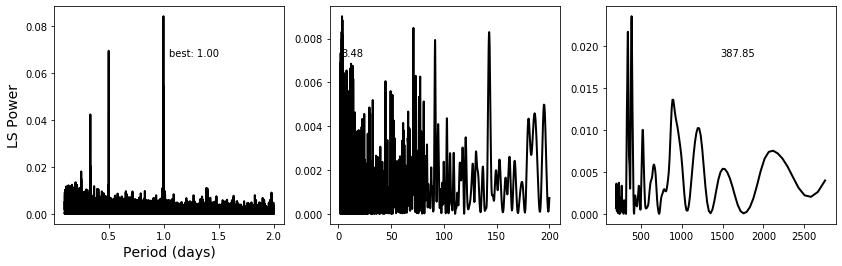

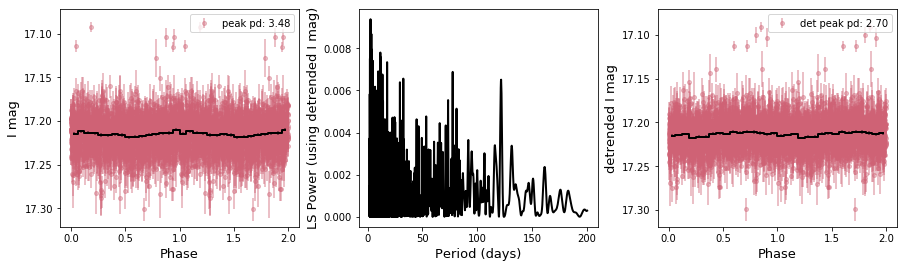

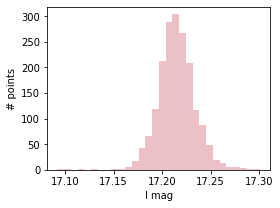

In [80]:
basic(27,pbins=16,saveall=save)

Source number: 100
RA,Dec (deg): 13.327146, -72.27155
Established period: nan
NS spin period: nan
Separation: 2.38253918281978
I and V-I correlation: -0.9360880028693165
V and V-I correlation: -0.2119596553252676
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.885
min I band:  16.679
I range:  0.20600000000000307
I stdev:  0.023154918729122117
max V band:  16.642
min V band:  16.6
V range:  0.04199999999999804
V stdev:  0.0086505165897573


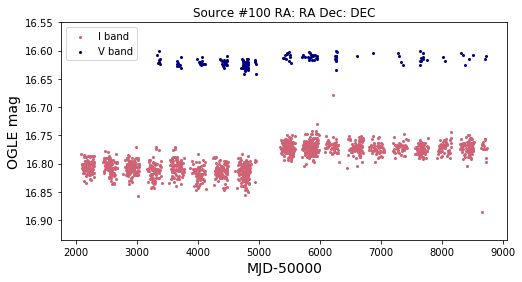

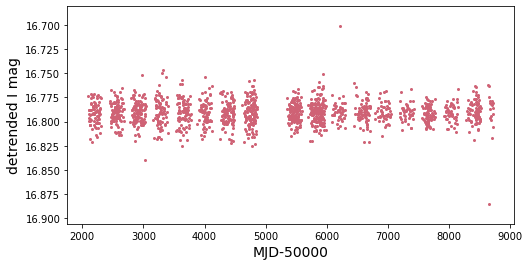

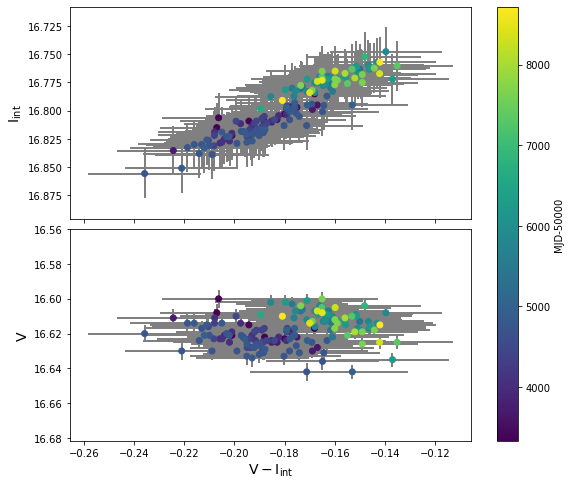

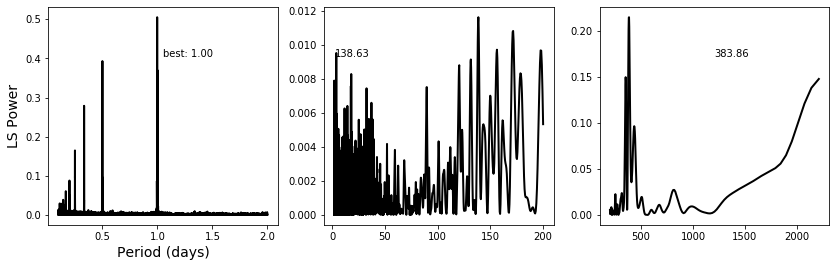

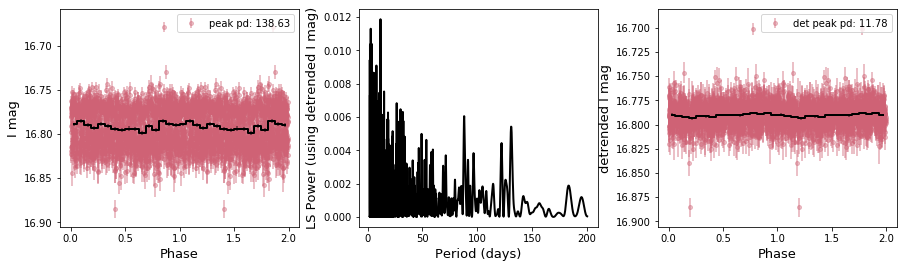

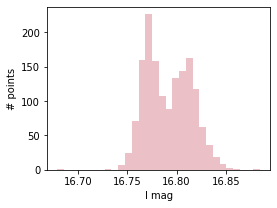

In [82]:
basic(28,pbins=16,saveall=save) #check calibration

Source number: 101
RA,Dec (deg): 13.371667, -72.56333
Established period: nan
NS spin period: nan
Separation: 0.6750252590555292
I and V-I correlation: -0.7681050531669736
V and V-I correlation: 0.9700221010725473
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.642
min I band:  14.482
I range:  0.16000000000000014
I stdev:  0.027345771371484404
max V band:  14.756
min V band:  14.211
V range:  0.5449999999999999
V stdev:  0.08622969594507024


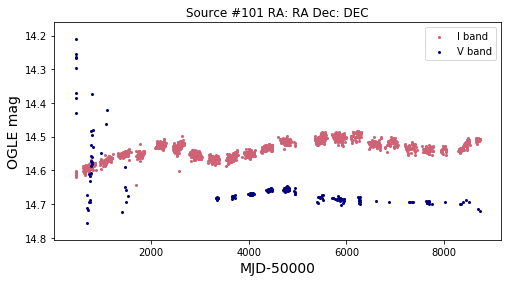

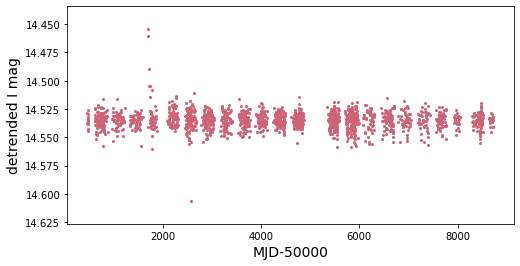

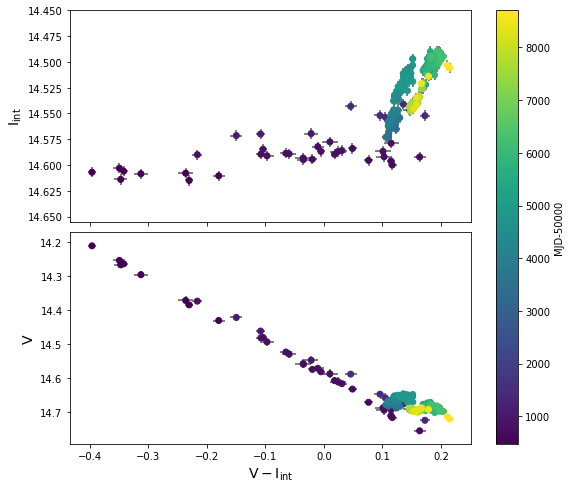

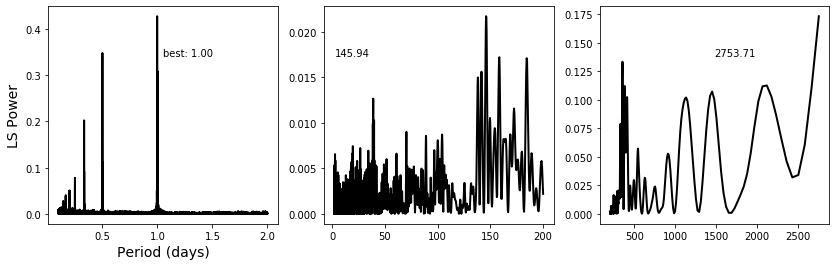

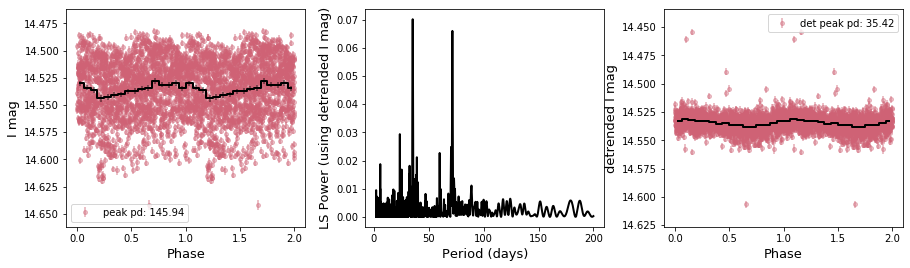

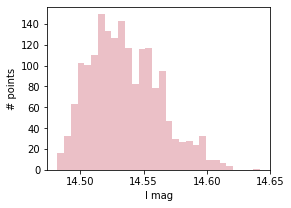

In [83]:
basic(29,pbins=16,saveall=save) 

Source number: 104
RA,Dec (deg): 13.423982, -72.88615
Established period: nan
NS spin period: nan
Separation: 2.458240850477693
I and V-I correlation: -0.8755528565327301
V and V-I correlation: -0.616191492468143
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.484
min I band:  14.399
I range:  1.0850000000000009
I stdev:  0.3385370001412316
max V band:  15.308
min V band:  13.735
V range:  1.5730000000000004
V stdev:  0.22299204637314102


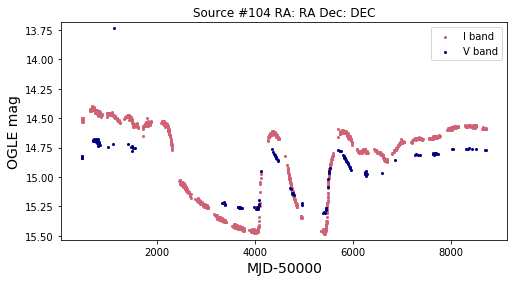

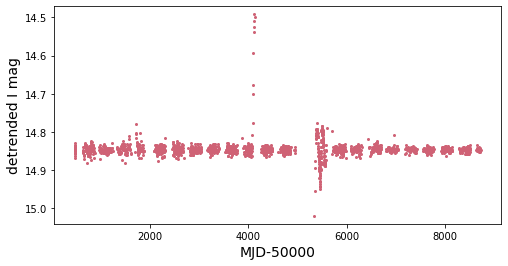

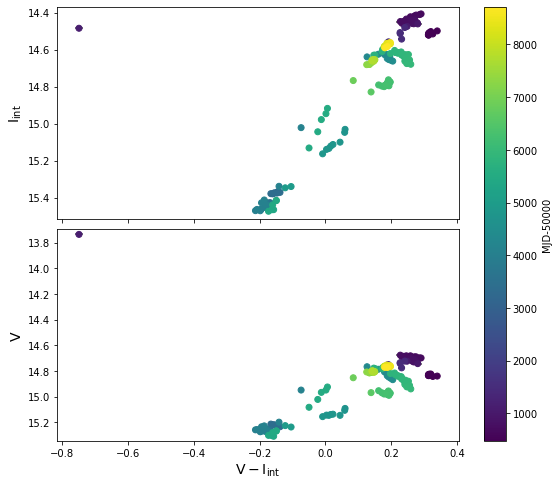

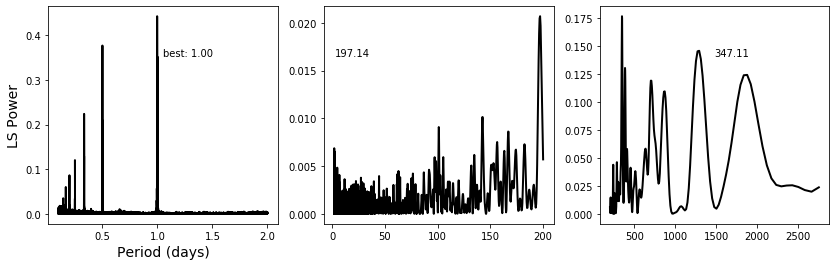

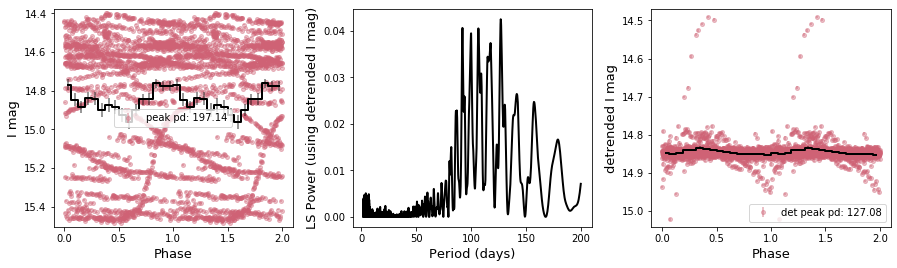

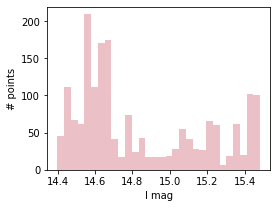

In [84]:
basic(30,pbins=16,saveall=save)

Source number: 105
RA,Dec (deg): 13.46875, -72.44417
Established period: nan
NS spin period: nan
Separation: 1.4931021441023236
I and V-I correlation: -0.9349924737776012
V and V-I correlation: -0.772488003562978
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  13.469
min I band:  13.286
I range:  0.18299999999999983
I stdev:  0.028290829067620708
max V band:  14.028
min V band:  13.978
V range:  0.05000000000000071
V stdev:  0.015506976377554842


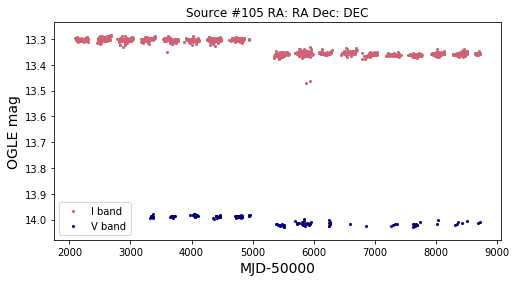

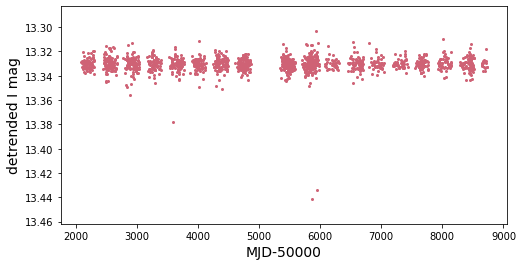

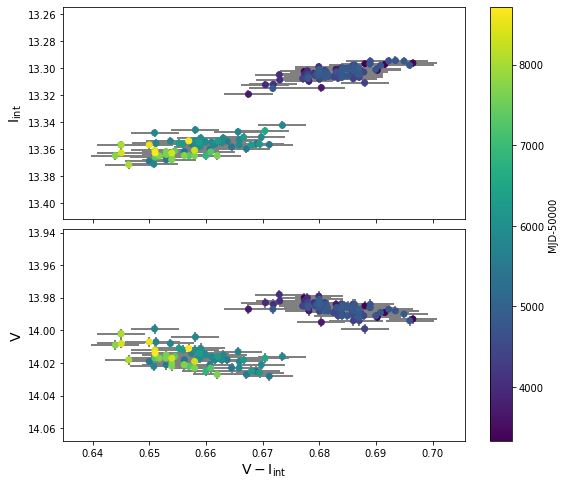

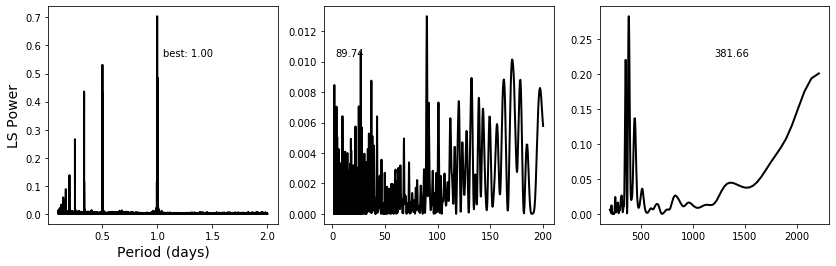

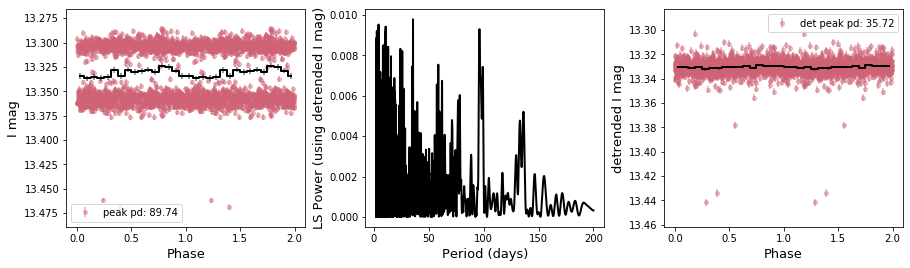

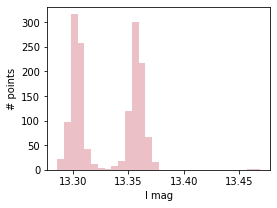

In [85]:
basic(31,pbins=16,saveall=save) 

Source number: 106
RA,Dec (deg): 13.53615, -72.53543
Established period: nan
NS spin period: nan
Separation: nan
I and V-I correlation: -0.72135262346909
V and V-I correlation: 0.8364826423834628
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  17.094
min I band:  16.898
I range:  0.1960000000000015
I stdev:  0.04359469489083697
max V band:  17.209
min V band:  16.942
V range:  0.26699999999999946
V stdev:  0.04693304173475907


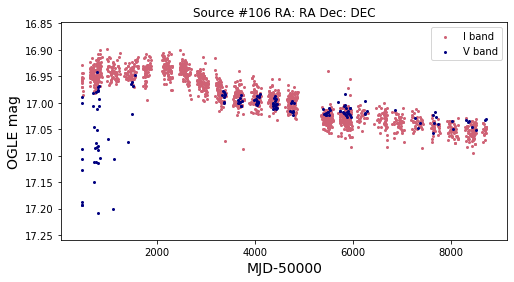

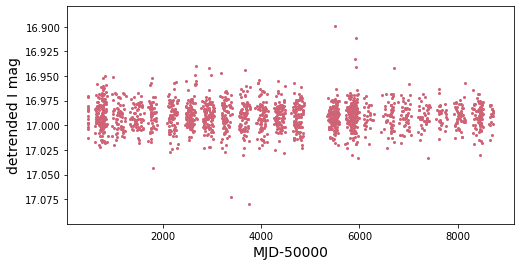

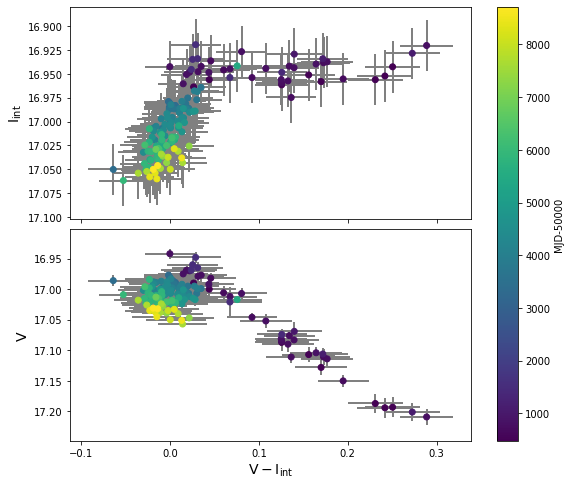

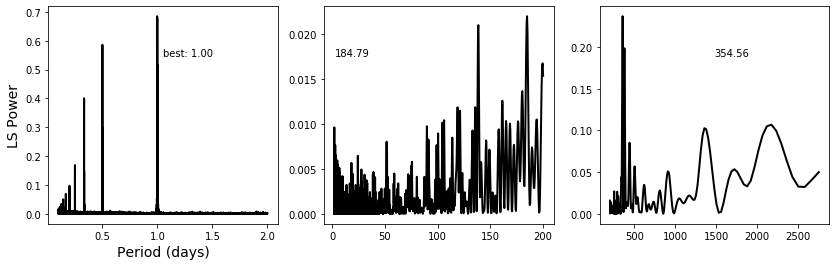

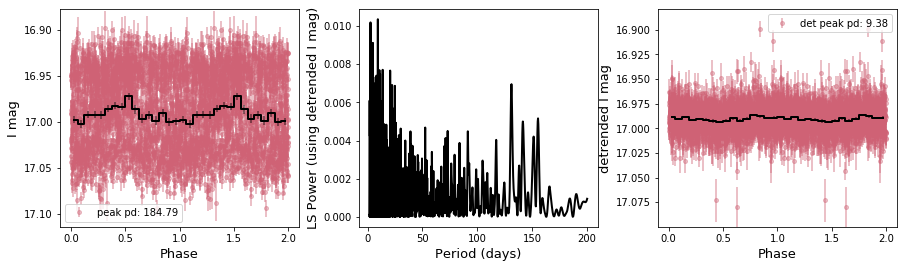

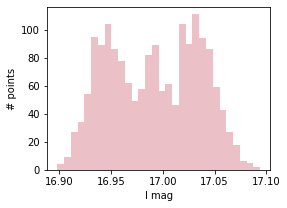

In [86]:
basic(32,pbins=16,saveall=save) 

Source number: 107
RA,Dec (deg): 13.538656, -72.695335
Established period: nan
NS spin period: nan
Separation: 1.0859548508868178
empty file for OIII I
I and V-I correlation: -0.057333142384844854
V and V-I correlation: 0.978473180595306
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  13.053
min I band:  12.323
I range:  0.7300000000000004
I stdev:  0.15480118197953385
max V band:  14.256
min V band:  12.968
V range:  1.2880000000000003
V stdev:  0.3090547910797653


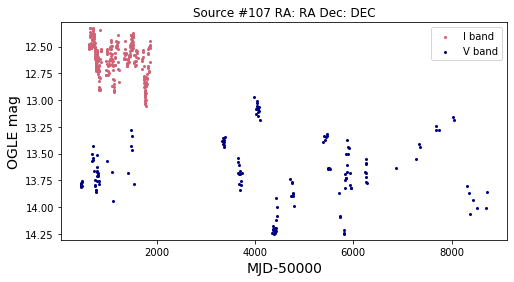

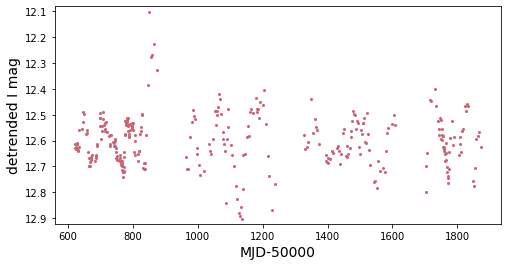

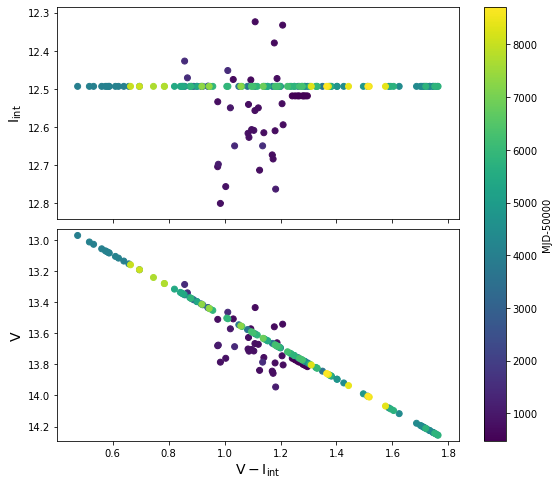

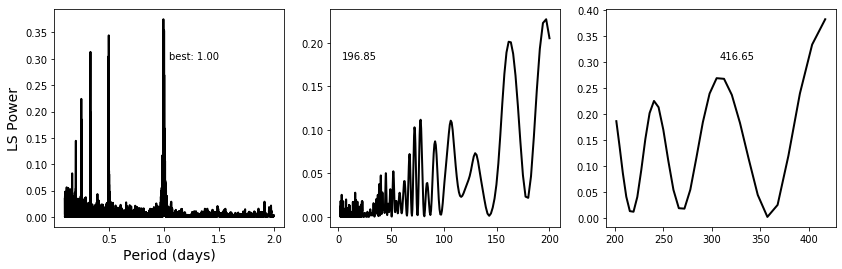

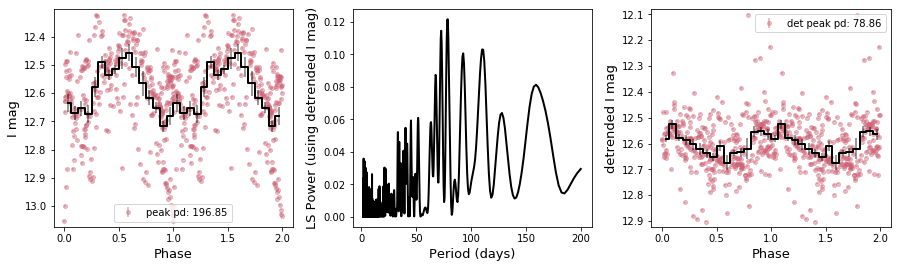

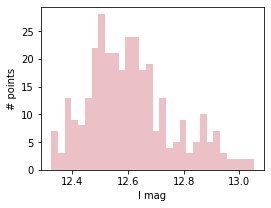

In [87]:
basic(33,pbins=16,saveall=save) #interpolation doesn't make sense for this source; maybe do periodicity search in V band (as well)

Source number: 111
RA,Dec (deg): 13.782148, -72.37787
Established period: nan
NS spin period: nan
Separation: 0.7733069774609475
I and V-I correlation: -0.4499013176301471
V and V-I correlation: 0.3944493577891568
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.621
min I band:  14.414
I range:  0.20700000000000074
I stdev:  0.016476346637921153
max V band:  14.435
min V band:  14.362
V range:  0.0730000000000004
V stdev:  0.011796221696021795


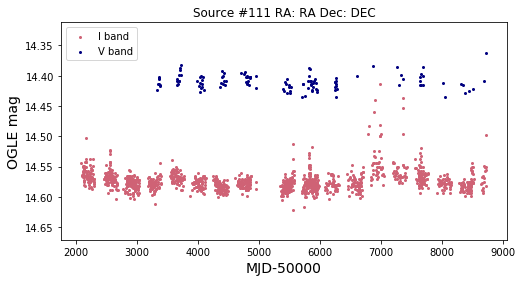

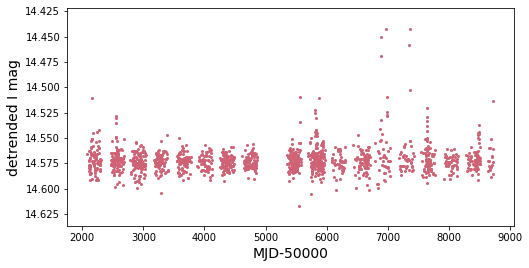

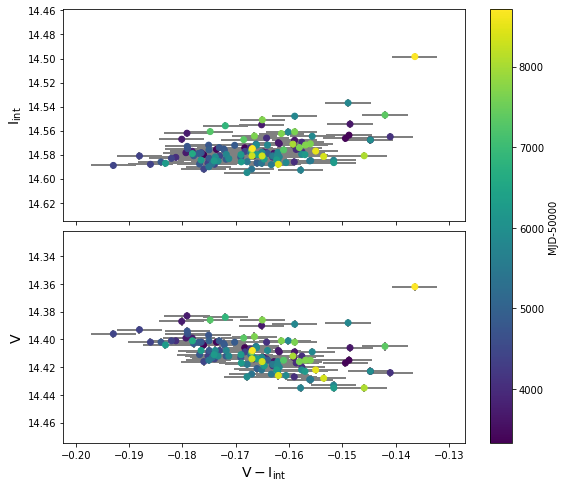

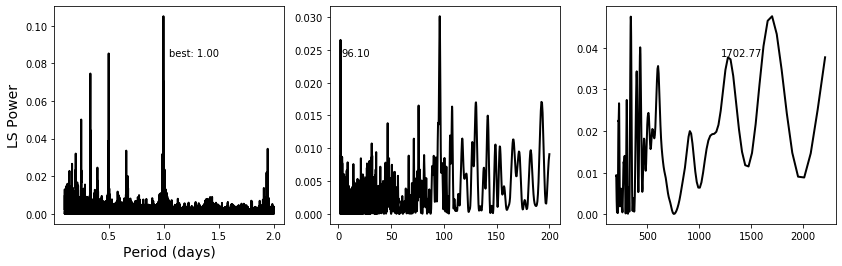

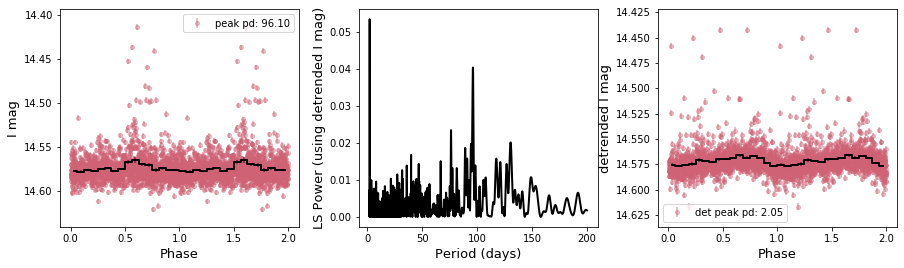

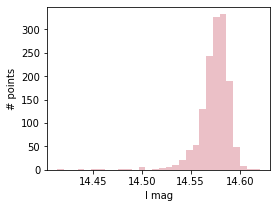

In [88]:
basic(34,pbins=16,saveall=save) 

Source number: 114
RA,Dec (deg): 14.022837, -72.00308
Established period: nan
NS spin period: nan
Separation: 1.1271267307353983
I and V-I correlation: -0.9149324003847996
V and V-I correlation: -0.5085433409713094
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  17.021
min I band:  16.811
I range:  0.21000000000000085
I stdev:  0.02929534853808877
max V band:  16.822
min V band:  16.744
V range:  0.0779999999999994
V stdev:  0.017985784620867282


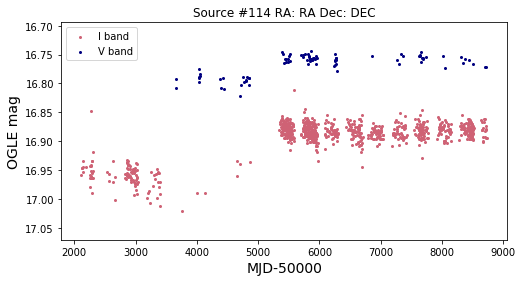

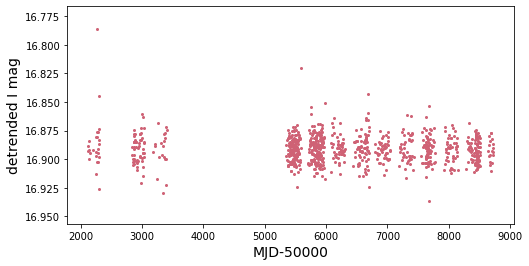

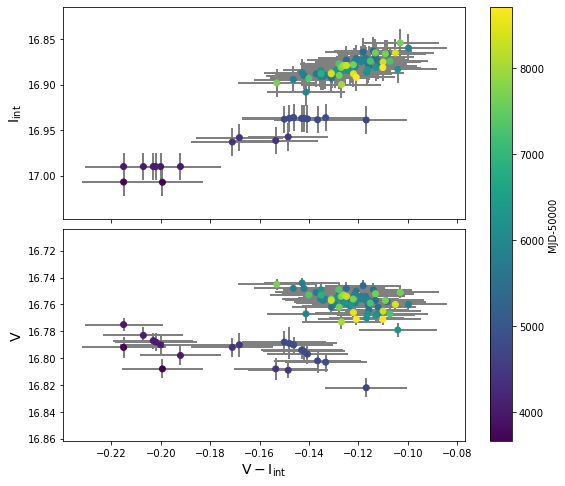

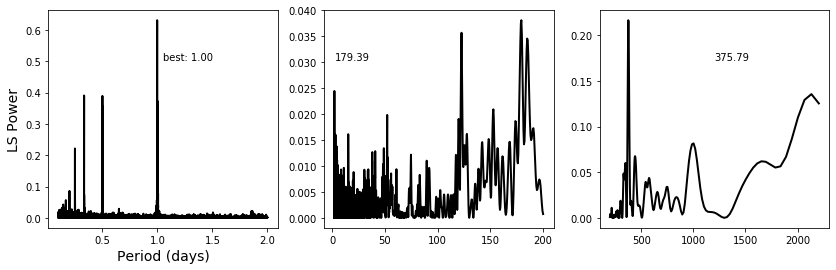

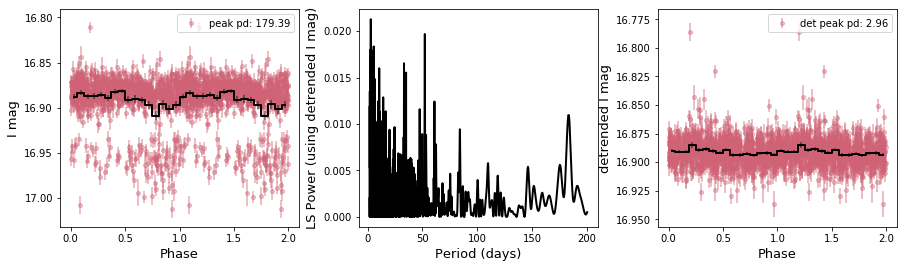

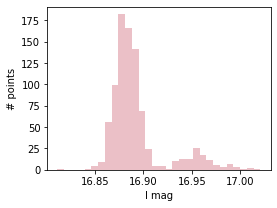

In [89]:
basic(35,pbins=16,saveall=save) #check calibration

Source number: 115
RA,Dec (deg): 14.057791, -72.4999
Established period: 72.231
NS spin period: nan
Separation: 1.072509092593595
I and V-I correlation: -0.3634415884802355
V and V-I correlation: 0.5967636297255688
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 145


max I band:  14.706
min I band:  14.346
I range:  0.35999999999999943
I stdev:  0.04009890140981963
max V band:  14.666
min V band:  14.544
V range:  0.12199999999999989
V stdev:  0.029576642353463672


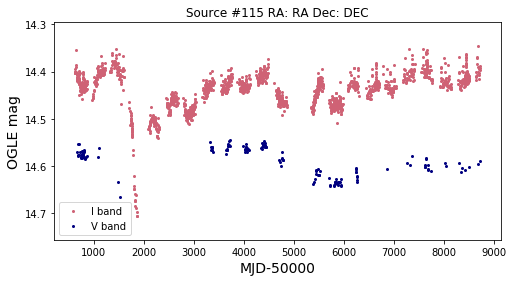

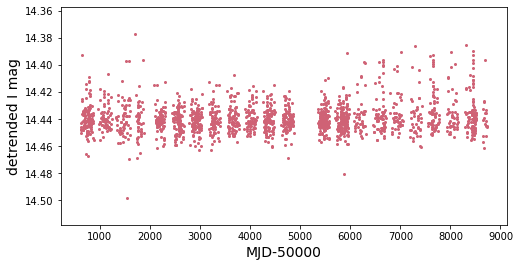

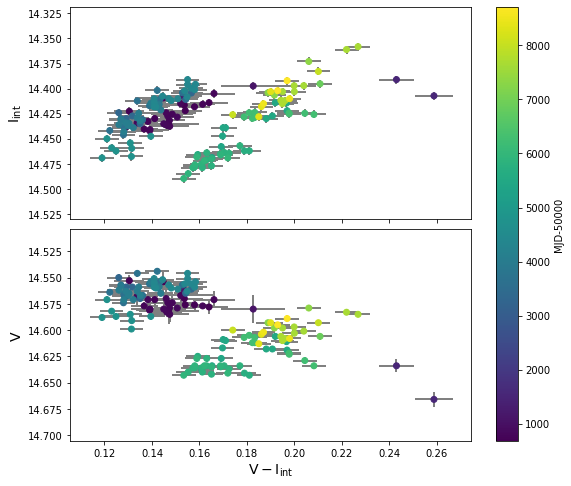

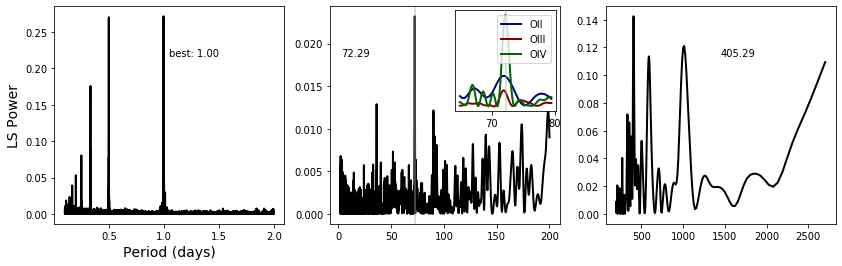

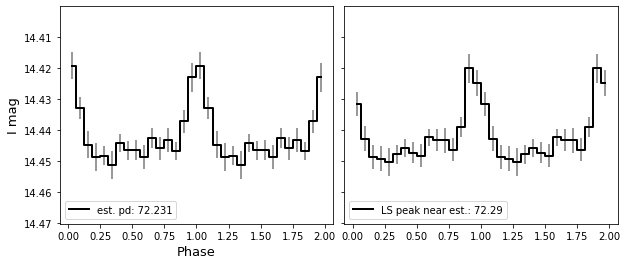

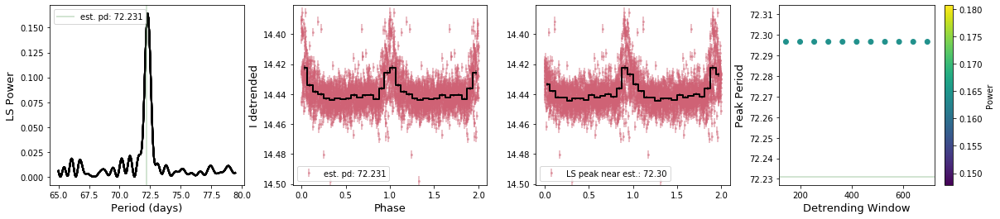

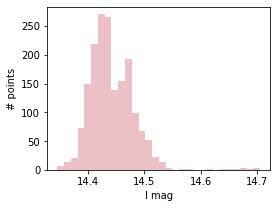

In [90]:
basic(36,pbins=16,saveall=save) 

Source number: 116
RA,Dec (deg): 14.061033, -72.632164
Established period: nan
NS spin period: nan
Separation: 0.8958477176463405
I and V-I correlation: -0.4230636455926597
V and V-I correlation: 0.021972129599033417
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.663
min I band:  14.176
I range:  0.4870000000000001
I stdev:  0.10715396199222854
max V band:  14.973
min V band:  14.521
V range:  0.45199999999999996
V stdev:  0.10184484746992924


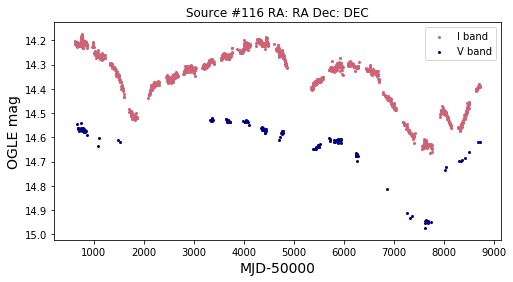

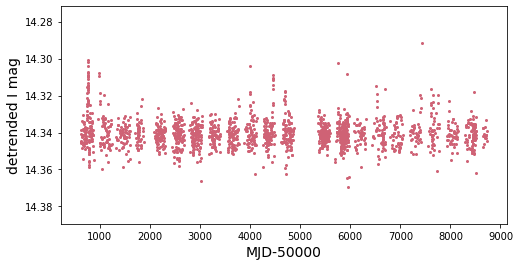

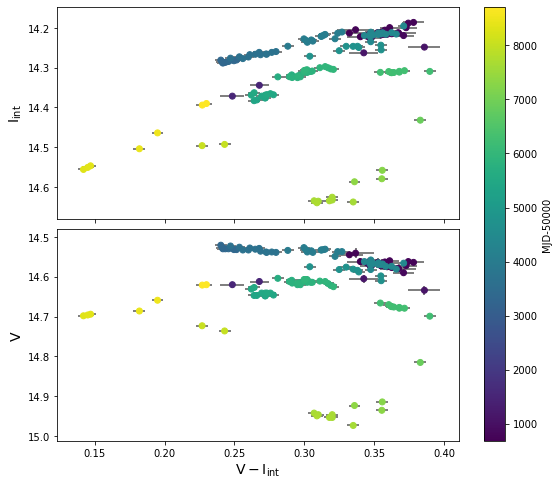

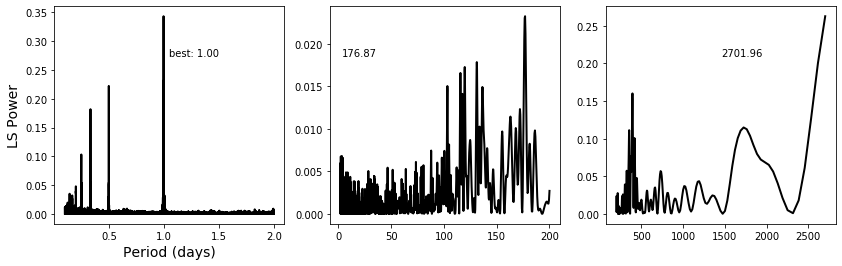

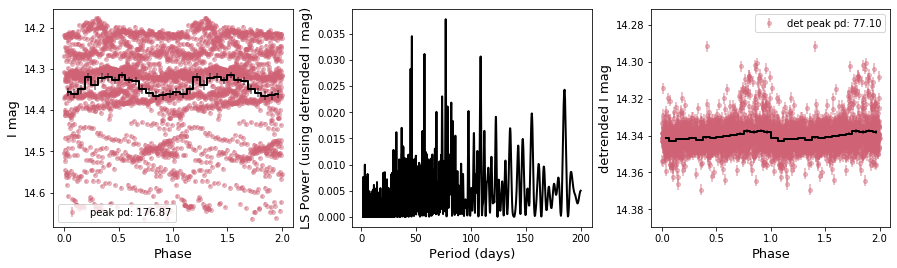

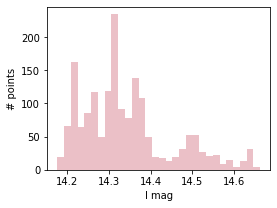

In [91]:
basic(37,pbins=16,saveall=save)

Source number: 119
RA,Dec (deg): 14.348582, -72.39883
Established period: nan
NS spin period: nan
Separation: 1.7069379325809675
I and V-I correlation: -0.9562602917034363
V and V-I correlation: -0.8245738782996825
using best period from middle periodogram to phase-fold data, after detrending with 100
running periodogram on detrended data


max I band:  15.743
min I band:  14.517
I range:  1.2260000000000009
I stdev:  0.06939099506287752
max V band:  14.815
min V band:  14.627
V range:  0.18799999999999883
V stdev:  0.03787273485462357


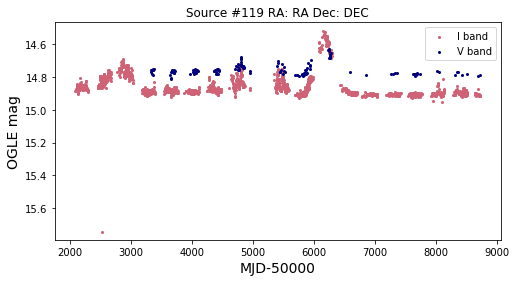

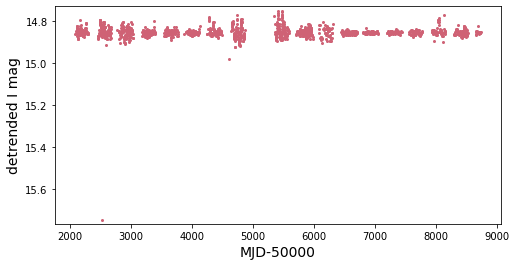

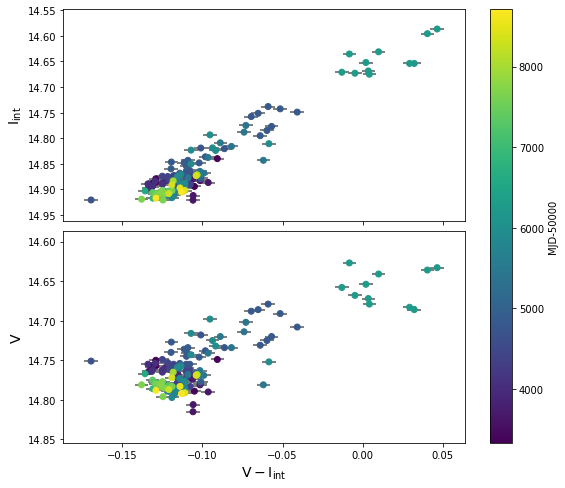

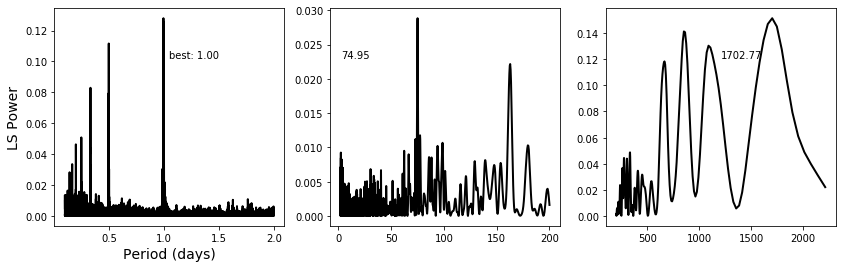

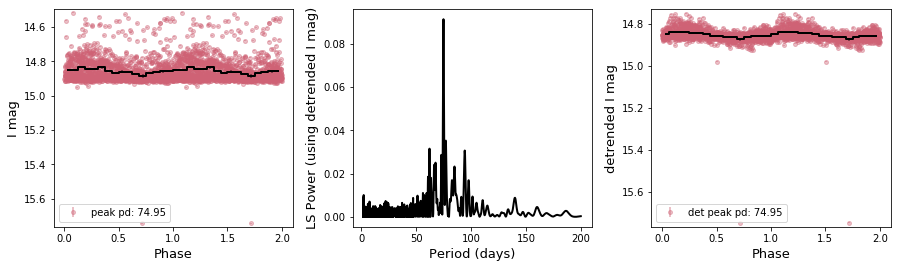

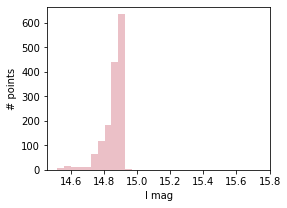

In [94]:
basic(38,pbins=16,saveall=save,window=100) #outliers but still consistent period independent of window

Source number: 121
RA,Dec (deg): 15.126078, -72.34253
Established period: nan
NS spin period: nan
Separation: 0.950553401074245
I and V-I correlation: 0.11779854679896275
V and V-I correlation: 0.9598427579632554
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.591
min I band:  14.413
I range:  0.17799999999999905
I stdev:  0.02122196424896646
max V band:  14.904
min V band:  14.575
V range:  0.3290000000000006
V stdev:  0.05897846335440724


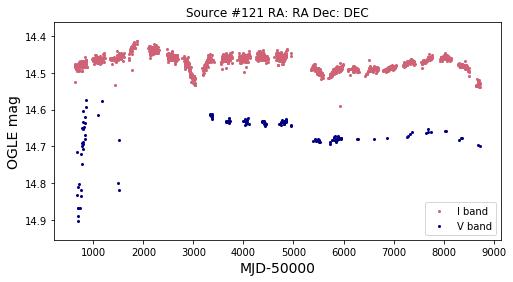

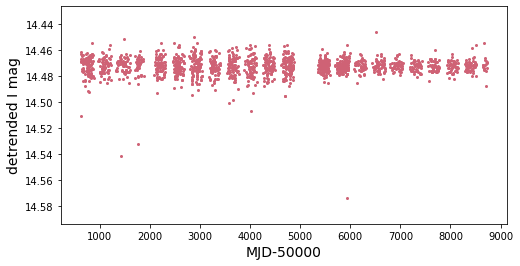

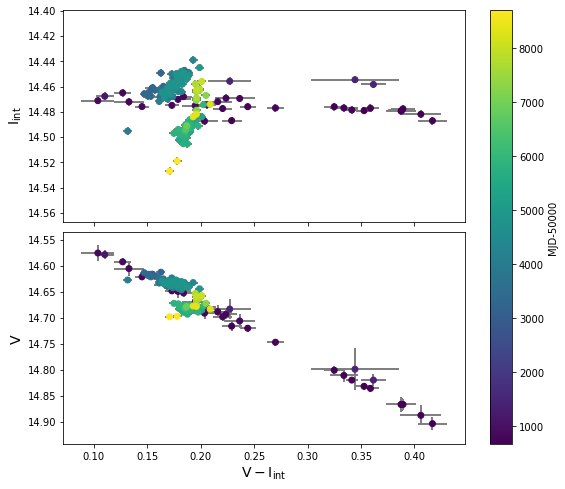

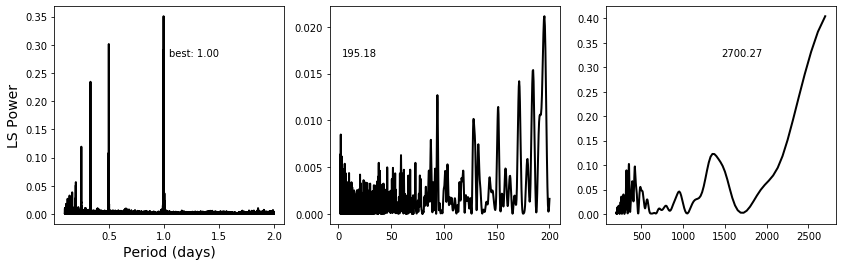

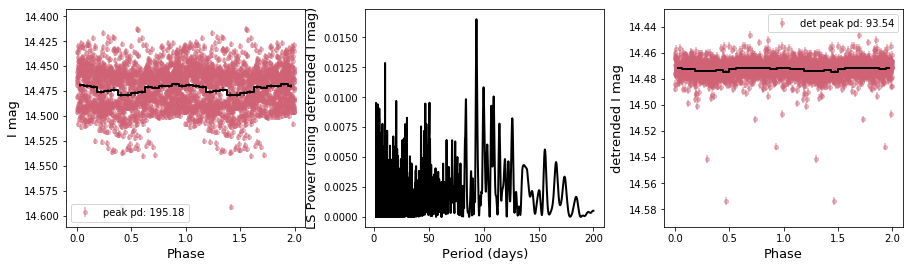

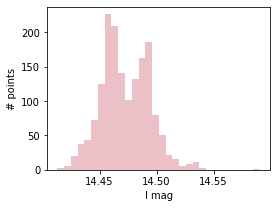

In [93]:
basic(39,pbins=16,saveall=save)

Source number: 123
RA,Dec (deg): 15.232704, -72.38897
Established period: nan
NS spin period: nan
Separation: 1.462548114503142
I and V-I correlation: -0.9094432831105441
V and V-I correlation: -0.5812402963746065
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  16.096
min I band:  15.588
I range:  0.5080000000000009
I stdev:  0.09208875137629839
max V band:  15.881
min V band:  15.686
V range:  0.19500000000000028
V stdev:  0.04413156129365994


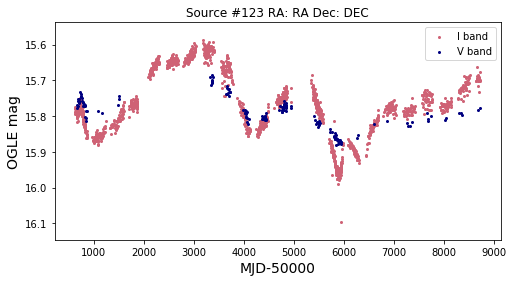

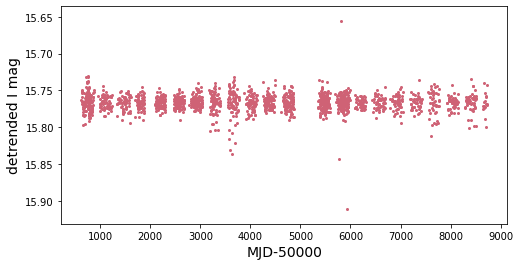

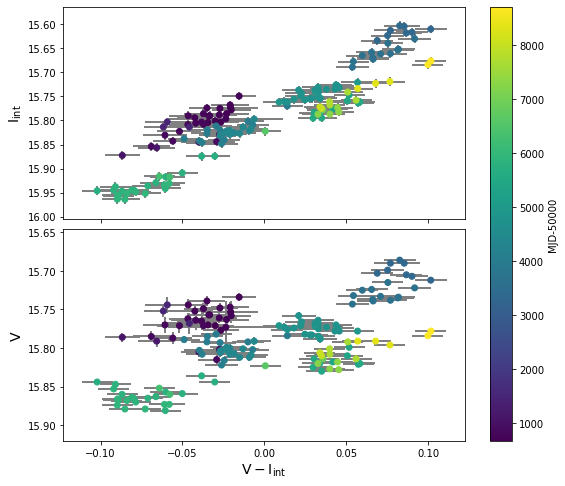

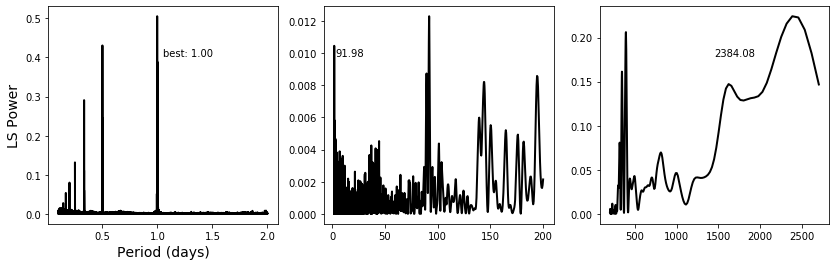

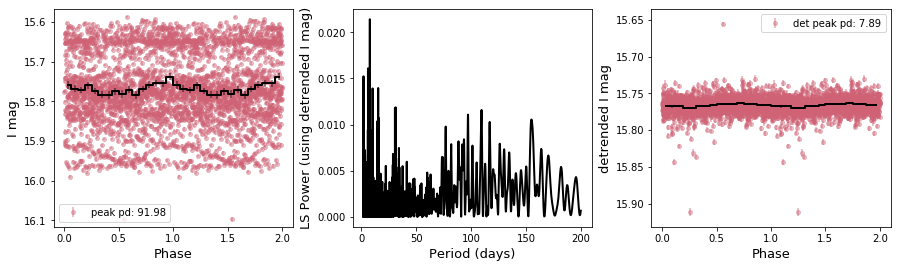

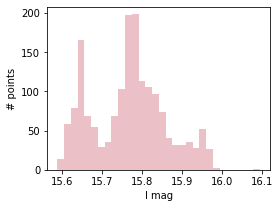

In [95]:
basic(40,pbins=16,saveall=save)

Source number: 124
RA,Dec (deg): 15.448232, -71.930756
Established period: nan
NS spin period: nan
Separation: 1.6167622603650758
I and V-I correlation: -0.828569247670743
V and V-I correlation: -0.1708069714597908
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.441
min I band:  14.25
I range:  0.19100000000000072
I stdev:  0.045313818763909636
max V band:  14.472
min V band:  14.411
V range:  0.06099999999999994
V stdev:  0.013629916582238482


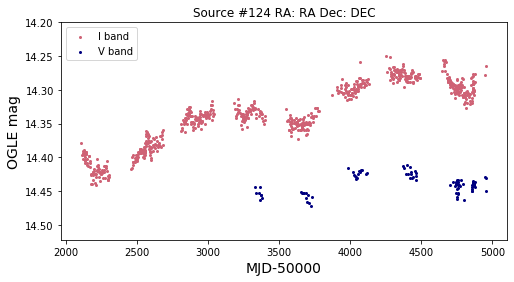

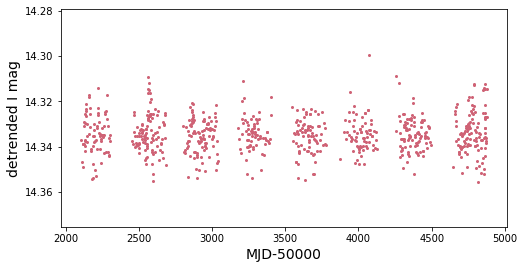

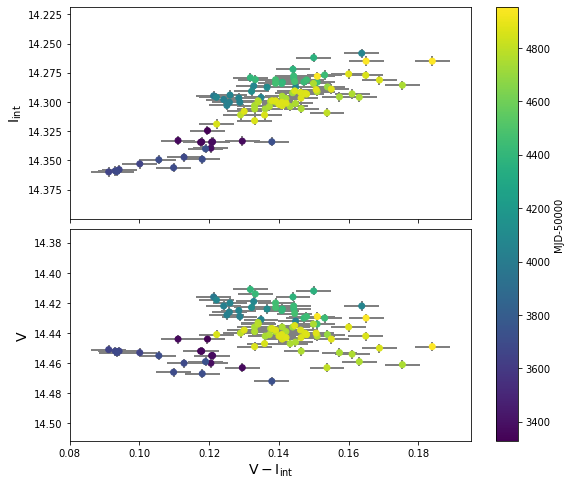

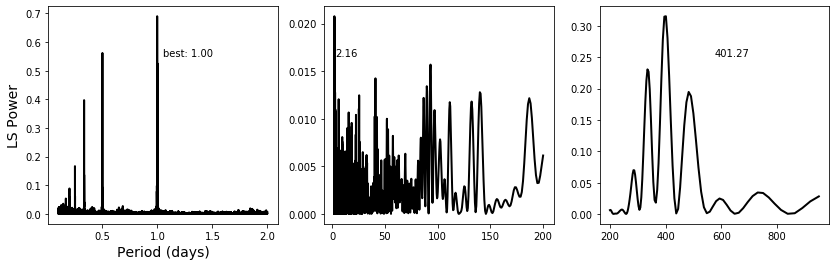

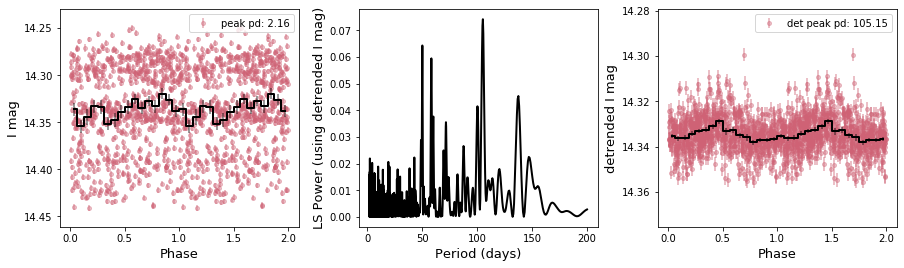

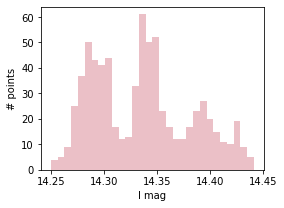

In [96]:
basic(41,pbins=16,saveall=save)

Source number: 126
RA,Dec (deg): 15.482882, -72.174416
Established period: nan
NS spin period: nan
Separation: 1.2498756452559772
I and V-I correlation: -0.9659853103847417
V and V-I correlation: -0.8976564703240444
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.288
min I band:  14.386
I range:  0.902000000000001
I stdev:  0.2868203072356147
max V band:  15.091
min V band:  14.549
V range:  0.5419999999999998
V stdev:  0.07621644991328248


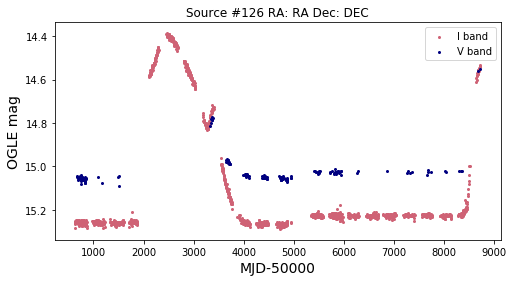

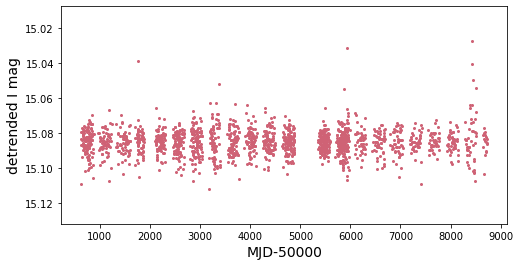

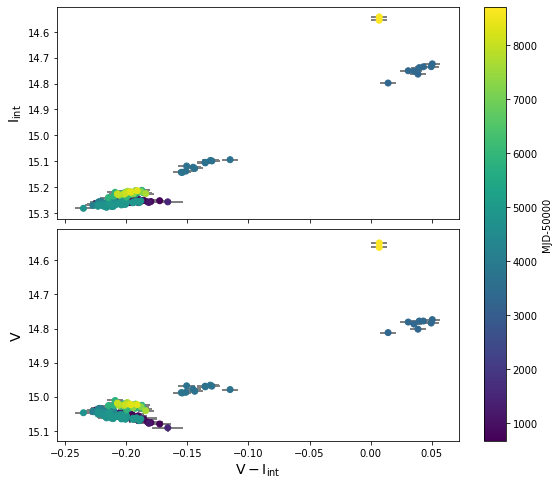

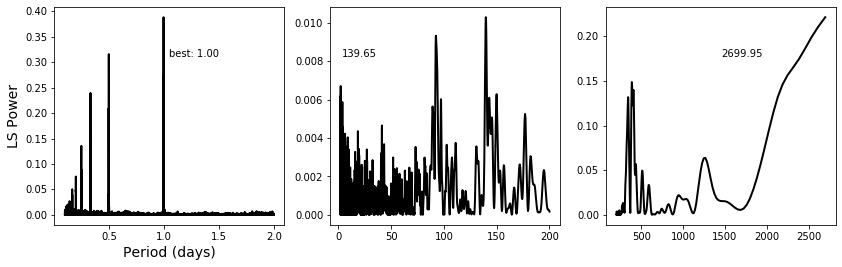

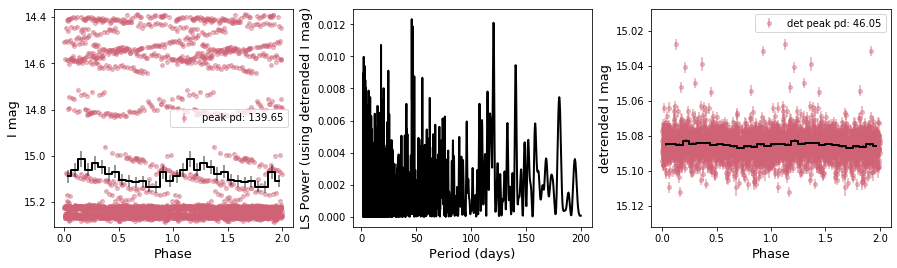

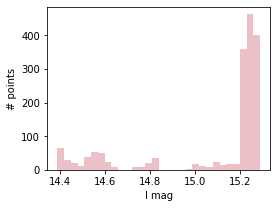

In [97]:
basic(42,pbins=16,saveall=save)

Source number: 128
RA,Dec (deg): 15.882196, -73.02901
Established period: nan
NS spin period: nan
Separation: 1.5884354148910238
I and V-I correlation: -0.945568932143824
V and V-I correlation: -0.8840279171742701
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.671
min I band:  14.66
I range:  1.0109999999999992
I stdev:  0.3720736764600826
max V band:  15.412
min V band:  14.696
V range:  0.7160000000000011
V stdev:  0.26996207157540797


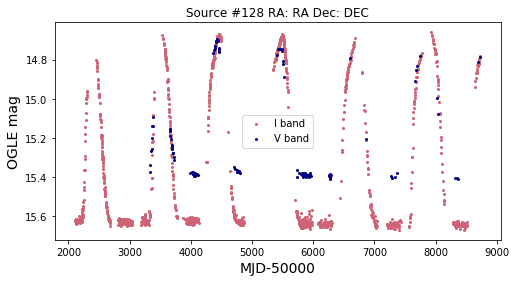

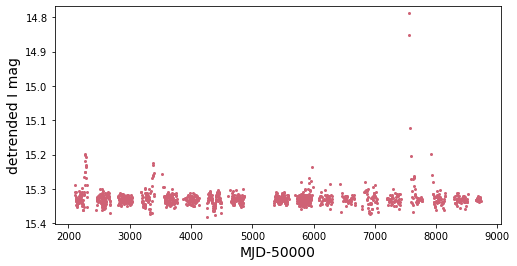

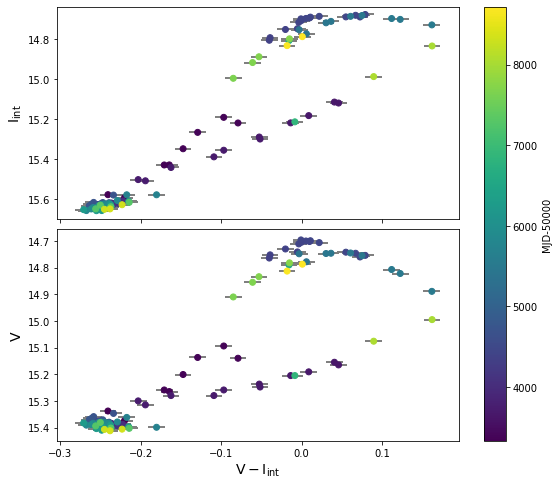

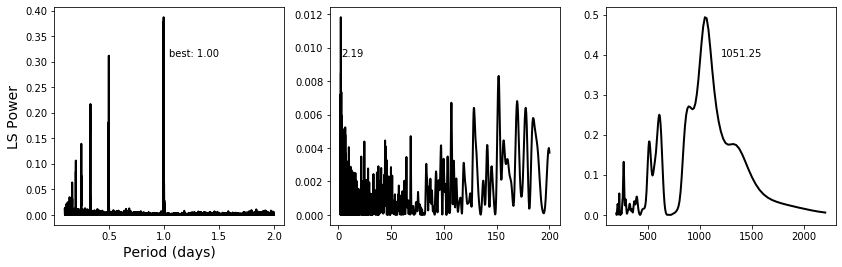

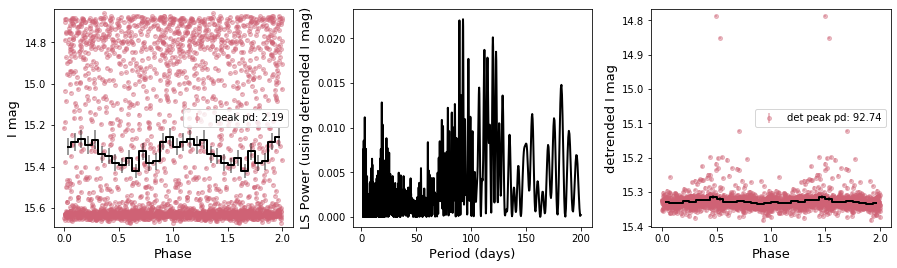

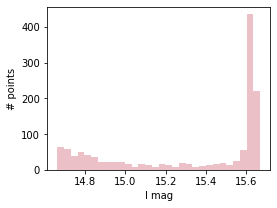

In [98]:
basic(43,pbins=16,saveall=save) #super-orbital trend

Source number: 129
RA,Dec (deg): 15.89009, -72.07152
Established period: nan
NS spin period: nan
Separation: nan
I and V-I correlation: -0.5620907892707462
V and V-I correlation: 0.6137246009339531
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  19.941
min I band:  18.535
I range:  1.4059999999999988
I stdev:  0.08861303756301052
max V band:  19.234
min V band:  18.849
V range:  0.38500000000000156
V stdev:  0.06649075852824171
Source number: 132
RA,Dec (deg): 16.122578, -72.52682
Established period: 29.75
NS spin period: nan
Separation: 2.2782803632779185
I and V-I correlation: -0.9647345966389136
V and V-I correlation: -0.9002903341106792
Phase-folding with established orbital period and highest peak within five days of that value...
Repeating periodogram and phase-fold after detrending
Window shown in phase-fold: 59


max I band:  16.07
min I band:  15.126
I range:  0.9440000000000008
I stde

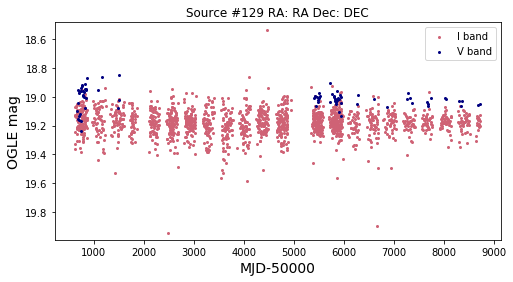

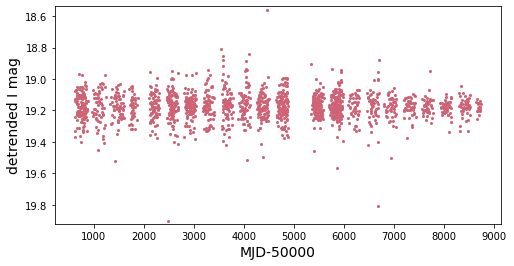

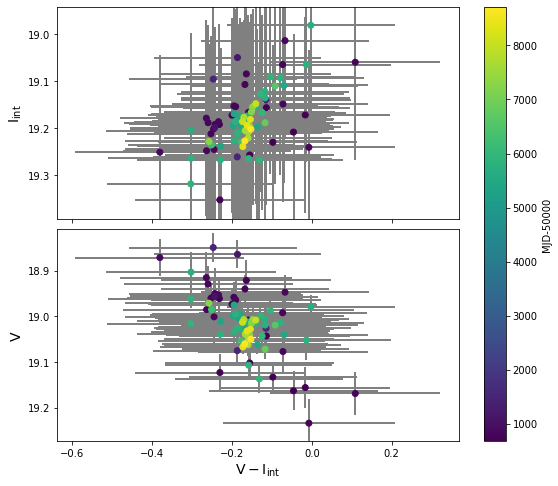

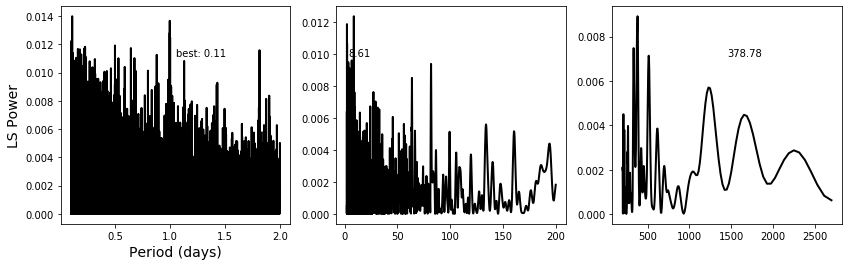

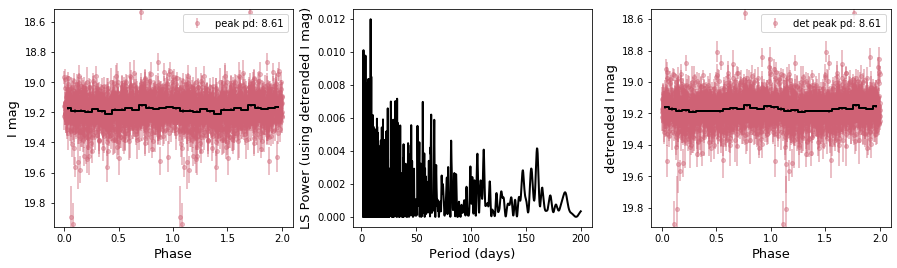

...

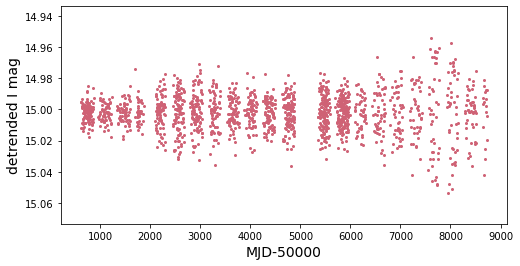

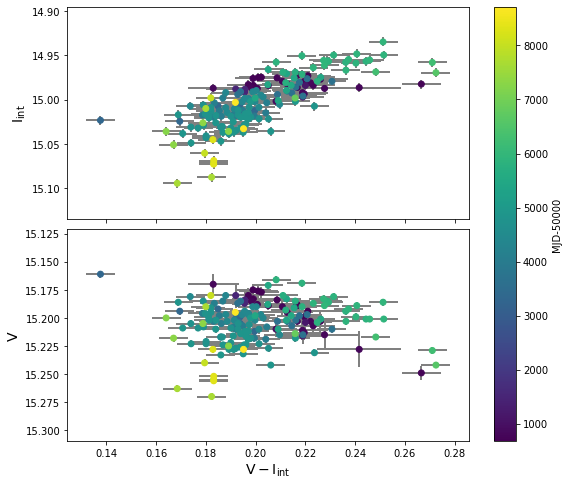

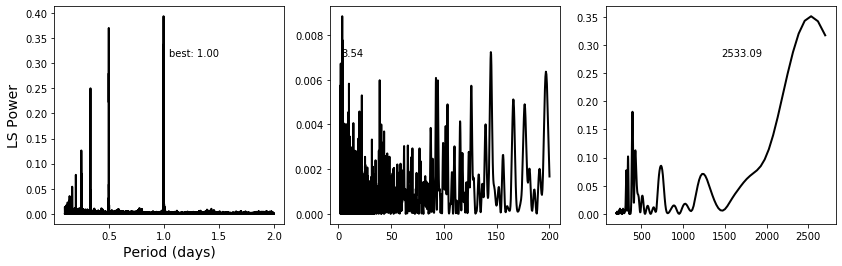

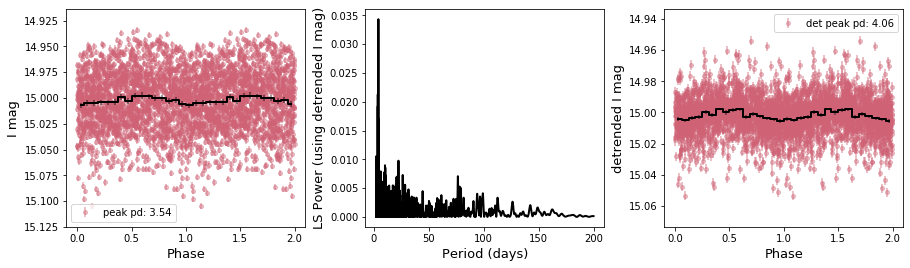

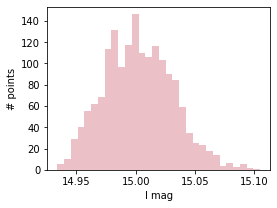

In [99]:
basic(44,pbins=16,saveall=save)
basic(45,pbins=16,saveall=save)
basic(46,pbins=16,saveall=save)

Source number: 136
RA,Dec (deg): 16.637384, -73.26193
Established period: nan
NS spin period: nan
Separation: 0.7895092496738987
I and V-I correlation: -0.9106565350482855
V and V-I correlation: -0.8698268160040609
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.408
min I band:  14.697
I range:  0.7110000000000003
I stdev:  0.208789924325467
max V band:  15.192
min V band:  14.714
V range:  0.47799999999999976
V stdev:  0.17802529227980976
Source number: 138
RA,Dec (deg): 17.08409, -72.22975
Established period: nan
NS spin period: nan
Separation: 2.4513254433738694
I and V-I correlation: -0.8268421061212996
V and V-I correlation: 0.6330344424842372
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  14.974
min I band:  14.657
I range:  0.31700000000000017
I stdev:  0.06837940809444144
max V band:  14.721

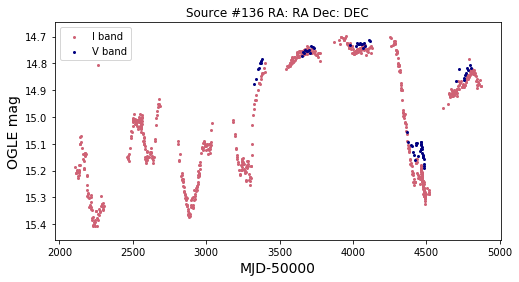

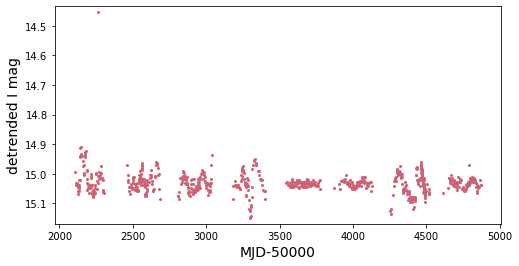

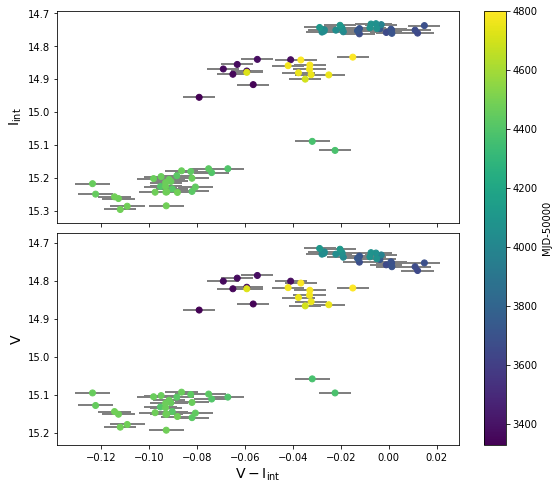

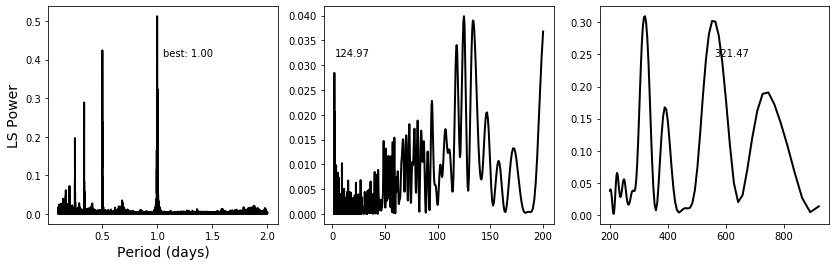

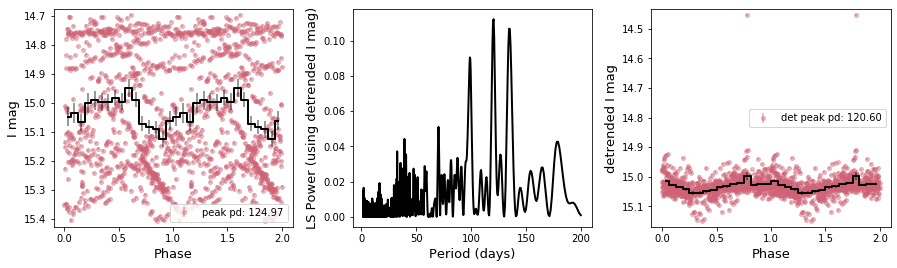

...

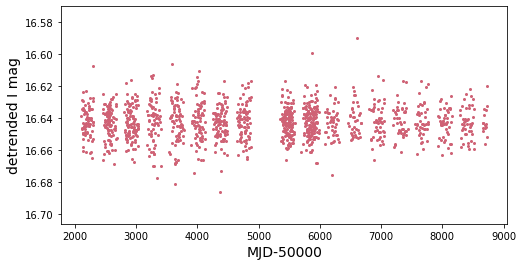

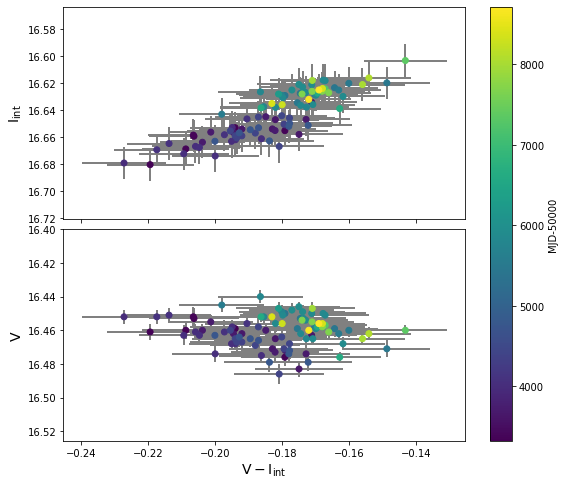

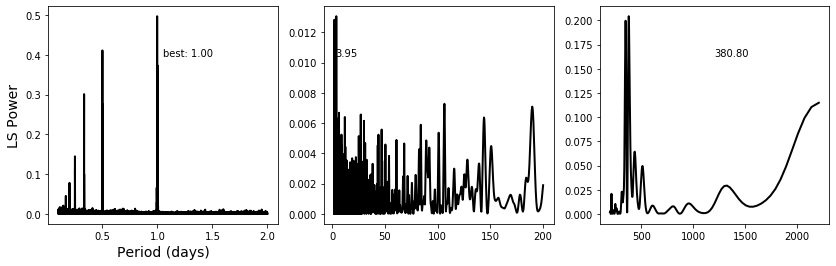

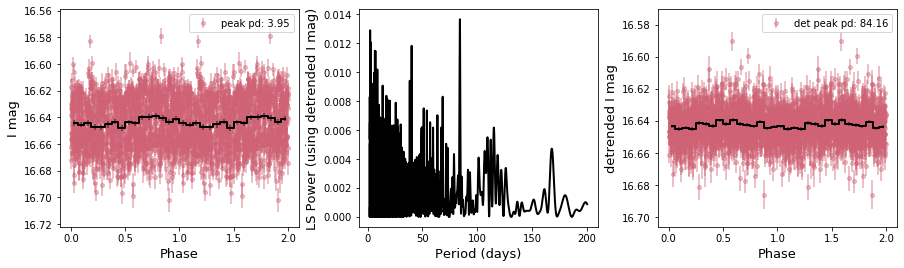

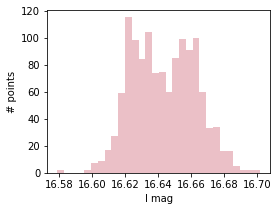

In [100]:
basic(47,pbins=16,saveall=save)
basic(48,pbins=16,saveall=save) #check calibration
basic(49,pbins=16,saveall=save)

Source number: 141
RA,Dec (deg): 19.91226, -73.50316
Established period: nan
NS spin period: nan
Separation: 0.17507451838220398
I and V-I correlation: -0.6276090420819046
V and V-I correlation: 0.33771794557920215
using best period from middle periodogram to phase-fold data, after detrending with 701
running periodogram on detrended data


max I band:  15.697
min I band:  15.56
I range:  0.13699999999999868
I stdev:  0.022658732320255746
max V band:  15.857
min V band:  15.77
V range:  0.08699999999999974
V stdev:  0.019781776872734327


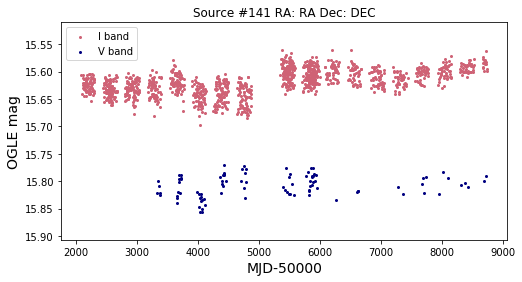

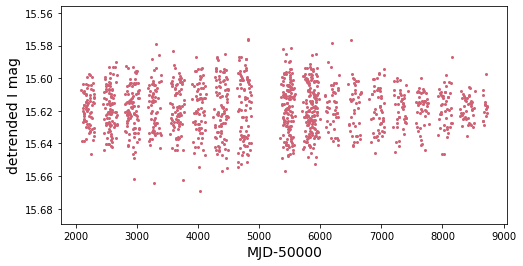

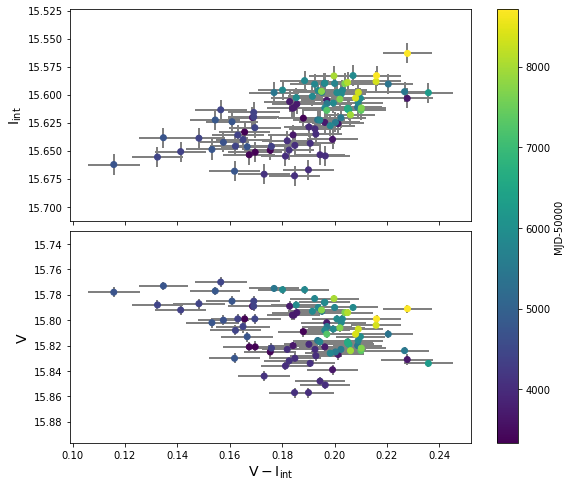

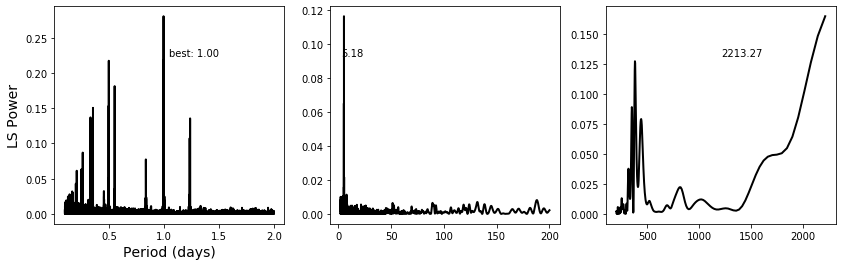

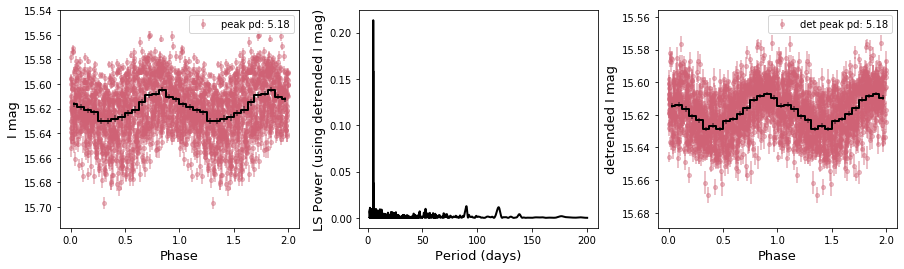

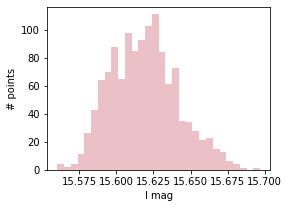

In [102]:
basic(50,pbins=16,saveall=save) #check calibration

In [103]:
len(cross)

51

### maybe with no established period, add a couple more steps 
- e.g. do it by the year, add FAP?

### writing out peak dictionary

In [106]:
peak_dict[141][0][:5] #example (top 5 peaks)

,period,power
3,0.997372,0.280527
2,0.999881,0.218817
11,0.499286,0.217352
7,0.552535,0.181327
12,0.498660,0.153543


In [107]:
np.save('part2peaks.npy', peak_dict) #writing out dictionary

In [108]:
read_dict = np.load('part2peaks.npy',allow_pickle='TRUE').item() #testing that loading peak dict back in works

In [109]:
read_dict[141][0][:5] #same output!

,period,power
3,0.997372,0.280527
2,0.999881,0.218817
11,0.499286,0.217352
7,0.552535,0.181327
12,0.498660,0.153543
